In [1]:
%env CUDA_VISIBLE_DEVICES=1

env: CUDA_VISIBLE_DEVICES=1


In [2]:
mprms = dict(
    epi_length=4096,
    pre_train_steps=50_000,
    epi_test_length=10_000,
    batch_size = 256,
    hid_size= 512,
    learning_rate = 1e-4,
    n_comp=2,
    smth_wnd = 256,
    exp_name = 'cc_net/exp-2_pm_ang',
    EPS = 1e-4,
    tau = 0.5
)

In [3]:
import pickle
import dill as pickle
import matplotlib.pyplot as plt
from collections import namedtuple, defaultdict
from IPython.display import clear_output
from tqdm.notebook import tqdm, trange, tqdm_notebook
import numpy as np
from abc import ABC, abstractmethod
import cloudpickle
import pyspark.serializers
import torch
import torch.nn as nn
import wandb
from abc import ABC, abstractmethod
from torch.optim import Adam
import os
import torch.nn.functional as F
pyspark.serializers.cloudpickle = cloudpickle
from torch.utils.data import DataLoader, random_split
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
wandb_logger = WandbLogger()
TradingEpisode = namedtuple('TradingEpisode', ['prices', 'features'])
EPS=1e-5 #Now desribed in functions.py
import radam
from radam import RAdam

TradingEpisode = namedtuple('TradingEpisode', ['prices', 'features'])

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

In [5]:
import torch
import pickle
from collections import namedtuple, defaultdict
from IPython.display import clear_output
from tqdm import tqdm, trange, tqdm_notebook

In [6]:
from prtfNNlib import *
import torch.nn as nn
import torch.nn.functional as F

In [23]:
def loadData(fileName):
    with open(fileName, 'rb') as f:
        tuple_data = pickle.load(f)
        type_data = pickle.loads(tuple_data[0])
        loaded_data = pickle.loads(tuple_data[1])
        loaded_data.__class__ = type_data
    return loaded_data

In [7]:
def extract_stationary_features(level_variable):
    features = pd.DataFrame(dict(px = level_variable)).assign(
        dpx1 = lambda x: x.px - x.px.ewm(64).mean(),
        dpx2 = lambda x: x.px.ewm(64).mean() - x.px.ewm(128).mean(),
        dpx3 = lambda x: x.px.ewm(128).mean() - x.px.ewm(256).mean(),
        dpx4 = lambda x: x.px.ewm(256).mean() - x.px.ewm(512).mean(),
        ).assign(px = lambda x: x - np.mean(x))#assign(px = lambda x: x - np.mean(x[:split_idx])) !!!!!!!!!!!!!!!!!!!!
    return features

f_multiplier = 1_000_000
class MeanReversionSet(torch.utils.data.Dataset):
    def __init__(self, dset, epi_len):
        super().__init__()
        self.features = dset.filter(regex='^dpx').values
        self.prices = dset.filter(regex='^px').values
        self.epi_len = epi_len
        self.num_ticks = len(self.features)
        print(self.num_ticks, " ticks")
    def __getitem__(self, i):
        features = torch.as_tensor(f_multiplier*self.features[i:i+self.epi_len] , dtype = torch.float32)
        prices   = torch.as_tensor(self.prices  [i:i+self.epi_len] , dtype = torch.float32)
        return TradingEpisode(prices = prices, features = features)
    def __len__(self):
        return self.num_ticks - self.epi_len

In [8]:
class NNBacktest(nn.Module):
    def __init__(self, n_out_features, hid_size, ):
        super().__init__()
        self.action_vector = torch.tensor([-1,0,1.0]).to(device)
       

    def forward(self, features, comp_prices, actions):
        new_positions = torch.matmul(self.action_vector, actions.permute(0,1,3,2) )
        new_positions[:, -1] = torch.zeros_like(new_positions[:, -1])
        new_positions[:, 0] = torch.zeros_like(new_positions[:, 0])
        d_positions = F.pad(new_positions[:,1:, :] - new_positions[:,:-1, :], (0, 0, 1, 0))
        d_cash = -d_positions * comp_prices
        cash = d_cash.sum(axis=1)
        return cash, new_positions, actions, d_cash

    def cash_to_stat(self, cash):
        mean_ret = cash.mean(axis=0)
        std_ret = cash.std(axis=0)
        ret_diff = cash.prod(axis=1).mean()
        sharpe = mean_ret / (EPS + std_ret)
        
        return sharpe, mean_ret, std_ret, ret_diff

## Describing Strategy

In [9]:
class Strategy(ABC):
    MLAlgorithm = None;
    
    def setMLAlgorithm(self, ML): # CAN BE CHANGED, BUT WE DON'T ADVISE TO DO THAT
        self.MLAlgorithm = ML
        
    def serialize(self, fileName): # do NOT ever change or remove it!!!
        type_data = cloudpickle.dumps(type(self))
        self_data = cloudpickle.dumps(self)
        with open(fileName, 'wb') as f:
            pickle.dump((type_data, self_data), f)
        
    @abstractmethod
    def dataPreparation(self, DP):
        pass
    
    @abstractmethod
    def getPosition(self, DP):
        pass

In [10]:
#DP = [df_from_orederbook1, df_from_orderbook2...] 
#Or
#DP = dict(DP1.getSym(): DP1, DP2.getSym(): DP2, DP3.getSym(): DP3, DP4.getSym(): DP4)

class NNStrategy(Strategy):
    def __init__(self,CONFIG,device = 'cuda' if torch.cuda.is_available() else 'cpu'):
        self.CONFIG = CONFIG
        self.device = device
    def dataPreparation(self, DP):
        mprms = self.CONFIG
        if type(DP) == list:
            pp1 = DP[0]
            pp2 = DP[1]
            pp3 = DP[2]
            pp4 = DP[3]
        if type(DP) == dict:
            pp1 = list(DP.values)[0]
            pp2 = list(DP.values)[1]
            pp3 = list(DP.values)[2]
            pp4 = list(DP.values)[3]
        
        ts1 = pp1.set_index('timestamp').resample('1S').aggregate({'bid1':'last', 'ask1':'last'}).fillna(method='ffill').assign(mpx=lambda x: 0.5*(x.ask1 + x.bid1)).drop(['bid1', 'ask1'], axis=1)
        ts2 = pp2.set_index('timestamp').resample('1S').aggregate({'bid1':'last', 'ask1':'last'}).fillna(method='ffill').assign(mpx=lambda x: 0.5*(x.ask1 + x.bid1)).drop(['bid1', 'ask1'], axis=1)
        ts3 = pp3.set_index('timestamp').resample('1S').aggregate({'bid1':'last', 'ask1':'last'}).fillna(method='ffill').assign(mpx=lambda x: 0.5*(x.ask1 + x.bid1)).drop(['bid1', 'ask1'], axis=1)
        ts4 = pp4.set_index('timestamp').resample('1S').aggregate({'bid1':'last', 'ask1':'last'}).fillna(method='ffill').assign(mpx=lambda x: 0.5*(x.ask1 + x.bid1)).drop(['bid1', 'ask1'], axis=1)
        
        dset = ts1.join(ts2, rsuffix='2').join(ts3, rsuffix='3').join(ts4, rsuffix='4').rename({'mpx':'mpx1'}, axis=1).dropna()
        
        dset_mx = extract_stationary_features(dset.mpx1) \
            .join(extract_stationary_features(dset.mpx2), rsuffix='2') \
            .join(extract_stationary_features(dset.mpx3), rsuffix='3') \
            .join(extract_stationary_features(dset.mpx4), rsuffix='4')
        
        
       # split_idx = int(len(dset)*0.1)
        #split_idx = 2000
        #split_idx = 0
        train_ds = dset_mx#[split_idx:]
        dataset = MeanReversionSet(train_ds, epi_len = mprms['epi_length'])
        mkt_loader = torch.utils.data.DataLoader(dataset, batch_size=mprms['batch_size'], shuffle=True, num_workers=4)
        n_features = train_ds.shape[1]
        
        #d_sample = next(iter(mkt_loader))
        
        #EPS = mprms['EPS']
        return dataset,mkt_loader, train_ds
    
    def getPosition(self, DP):
            device = self.device
            dataset, mkt_loader, train_ds = self.dataPreparation(DP)
            self.MLAlgorithm.to(device)
            mprms = self.CONFIG
            d_sample = next(iter(mkt_loader))
            features, comp_prices, actions = self.MLAlgorithm(d_sample.prices.to(device))
            
            return actions       

## Just Check

In [12]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
mprms = dict(
    epi_length=4096,
    pre_train_steps=50_000,
    epi_test_length=10_000,
    batch_size = 256,
    hid_size= 512,
    learning_rate = 1e-4,
    n_comp=2,
    smth_wnd = 256,
    exp_name = 'cc_net/',
    EPS = 1e-4,
    tau = 0.5
)



In [50]:
model = MData2Actions(n_features = 4, n_components=mprms['n_comp'], hid_size = mprms['hid_size'], device=device).to(device)
model.rotation.weight = torch.nn.Parameter( torch.Tensor(np.random.randn(2,4)), requires_grad=False)

In [51]:
model.rotation.weight

Parameter containing:
tensor([[-1.0276, -1.2612,  0.3099,  0.6561],
        [-0.5717, -0.2356, -0.8113,  1.1800]])

In [52]:
NN = NNStrategy(mprms)

In [53]:
NN.setMLAlgorithm(model)

In [13]:
pp1 = pd.read_parquet('order-book-parquets/order-book_BBG000L1Y4G0_2020-10-26.parquet')
pp2 = pd.read_parquet('order-book-parquets/order-book_BBG000XFZZV9_2020-10-26.parquet')
pp3 = pd.read_parquet('order-book-parquets/order-book_BBG000XG00K4_2020-10-26.parquet')
pp4 = pd.read_parquet('order-book-parquets/order-book_BBG000XG01J4_2020-10-26.parquet')

In [14]:
DP  = [pp1,pp2,pp3,pp4]

In [18]:
p = NN.getPosition(DP)

75600  ticks


In [19]:
p.shape

torch.Size([256, 3584, 2, 3])

## Backtest 

In [28]:
%run ./Downloads/Tester.ipynb

In [175]:
@nb.njit()
def test(TS1,TS2, cost = 1.5, pl_l = 10_000_000):
    TF1 = TStoNUMBA(TS1)
    TF2 = TStoNUMBA(TS2)
    
    total_max_position = 2       # max position for all instruments
    max_position = 1.0#0.18          # max position for each instrument #!! Try: 1.0
    order_qty = 1.0#0.18             # qty for one order #!!                Try: 1.0
    dbg_coef = 5                 # debug k, don't use
    exp_sec = 1                  # expiration time in seconds
    limitation = 1               # max count of operation in 1 second
    max_unprofit_count = 3       # num of unprofitable trades (hit-lift protection) 
    cooldown = 1                 # cooldown time in seconds (hit-lift protection)
    place_latency =  pl_l #50_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond  #!!
    cancel_latency = 5_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond #!!
    take_cost = cost#7.5              # bips ## !!!
    make_cost = 2.5              # bips ## !!!
    max_pending_orders = 3      # max count of pending orders
    min_price_step = 0.001       # min step in orderbook, $
    
    simulation_Queue = True
    simulation_cost = True
    only_agressive_order = False
    only_passive_order = False
    
    p1 = Parameter(max_position, dbg_coef, exp_sec, limitation, max_unprofit_count, cooldown, place_latency, cancel_latency, 
                  max_pending_orders, order_qty, take_cost, make_cost, min_price_step,simulation_Queue, simulation_cost, 
                  only_agressive_order, only_passive_order, total_max_position)
    Exch1 = ExchangeBT(TF1, p1)
    
    p2 = Parameter(0.77, dbg_coef, exp_sec, limitation, max_unprofit_count, cooldown, place_latency, cancel_latency, 
                  max_pending_orders, 0.77, take_cost, make_cost, min_price_step,simulation_Queue, simulation_cost, 
                  only_agressive_order, only_passive_order, total_max_position)
    Exch2 = ExchangeBT(TF2, p2)
    
    half_ping_matrix = np.array([0.,0.,0.,0.])
    
    BT = MultiExchBT(half_ping_matrix)
    
    BT.AddExch(Exch1)
    BT.AddExch(Exch2)
    
    BT.Run()
    
    return Exch1.m2m,Exch2.m2m,Exch1.position,Exch2.position,Exch1.commission,Exch2.commission
    

In [176]:
##Data - Just Loaded dataframes from order_books...
## DP - Loaded DataProviders of Kirzhan and Stanislav Style (list(loadData(DP1), loadData(DP2))...)




def Backtest(Strategy,Data,DP, cost = 1.5,pl_l = 10_000_000 ):
    
    
    result = Strategy.getPosition(Data).cpu()
    result1 = result[:,:,0,:]
    result2 = result[:,:,1,:]
    
   # print(result1.shape)
    
    decisions1 = np.array(torch.argmax(result1,dim = 2).view(-1).detach().cpu().tolist(), dtype = np.float32)
    decisions2 = np.array(torch.argmax(result2,dim = 2).view(-1).detach().cpu().tolist(), dtype = np.float32)
   # print(type(decisions2), ' ',type(decisions2[0]) )#packData(result.get("PCA").get('BBG000XG00Y9'), dictionaryOfDataProviders.get('BBG000XG00Y9'))
    TimeSeries1 = packData(decisions1,DP[0])
    TimeSeries2 = packData(decisions2,DP[1])
    
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = test(TimeSeries1,TimeSeries2,cost,pl_l)
    
    return  m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2

Test of backtest

In [27]:
%run ./Downloads/DataProvider.ipynb

In [24]:
DP1 = loadData('Downloads/DP1')

In [25]:
DP2 = loadData('Downloads/DP2')

In [59]:
m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])

75600  ticks


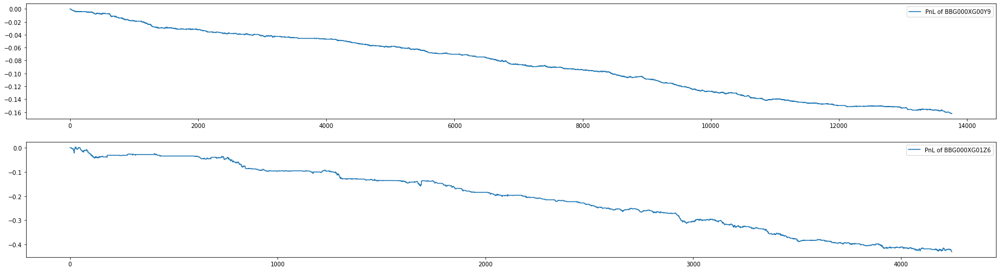

In [60]:
plt.figure(figsize=(30,30))    
plt.subplot(7,1,1)
plt.plot(m2m_1, label='PnL of ' + DP1.getSym())
plt.legend()
plt.subplot(7,1,2)
plt.plot(m2m_2, label='PnL of ' + DP2.getSym())
plt.legend()

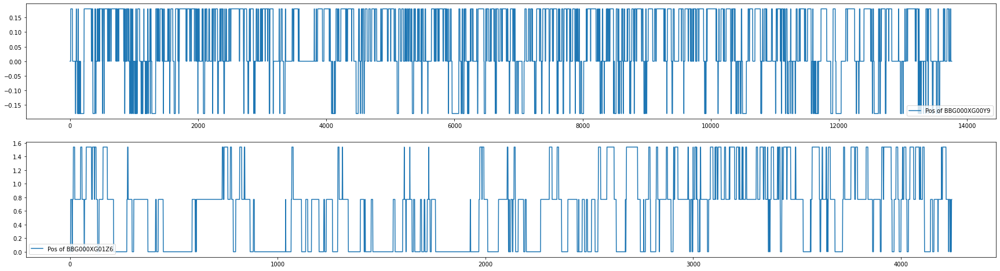

In [38]:
plt.figure(figsize=(30,30))    
plt.subplot(7,1,1)
plt.plot(pos_1, label='Pos of ' + DP1.getSym())
plt.legend()
plt.subplot(7,1,2)
plt.plot(pos_2, label='Pos of ' + DP2.getSym())
plt.legend()

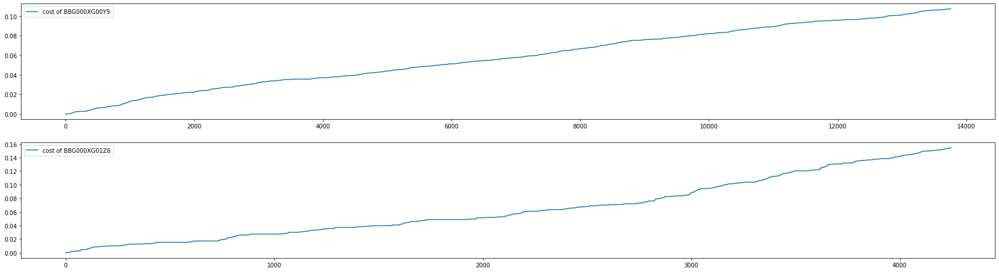

In [56]:
plt.figure(figsize=(30,30))    
plt.subplot(7,1,1)
plt.plot(comm_1, label='cost of ' + DP1.getSym())
plt.legend()
plt.subplot(7,1,2)
plt.plot(comm_2, label='cost of ' + DP2.getSym())
plt.legend()

## Trainer

In [29]:
import wandb

In [22]:
class NNBacktest(nn.Module):
    def __init__(self, n_out_features, hid_size, ):
        super().__init__()
        self.action_vector = torch.tensor([-1,0,1.0]).to(device)
       

    def forward(self, features, comp_prices, actions):
        new_positions = torch.matmul(self.action_vector, actions.permute(0,1,3,2) )
        new_positions[:, -1] = torch.zeros_like(new_positions[:, -1])
        new_positions[:, 0] = torch.zeros_like(new_positions[:, 0])
        d_positions = F.pad(new_positions[:,1:, :] - new_positions[:,:-1, :], (0, 0, 1, 0))
        d_cash = -d_positions * comp_prices
        cash = d_cash.sum(axis=1)
        return cash, new_positions, actions, d_cash

    def cash_to_stat(self, cash):
        mean_ret = cash.mean(axis=0)
        std_ret = cash.std(axis=0)
        ret_diff = cash.prod(axis=1).mean()
        sharpe = mean_ret / (EPS + std_ret)
        
        return sharpe, mean_ret, std_ret, ret_diff

In [47]:


class LightningShell(pl.LightningModule):

    def __init__(self,model, mkt_loader,mkte_test,CONFIG):
        super().__init__()
        self.CONFIG = CONFIG
        self.model = model
        self.mkte_test = mkte_test

    def forward(self, inp_features):
        return self.model(inp_features)

    def training_step(self, batch, batch_idx):
            t = self.current_epoch
            
            sharpe_reg = self.CONFIG['sharpe_reg']
            rotation_reg = self.CONFIG['rotation_reg']
            d_cash_reg = self.CONFIG['d_cash_reg']
            ang_dist_reg = self.CONFIG['ang_dist_reg']
            pm_reg = self.CONFIG['pm_reg']
            moving_average_norm = float('inf')
            
            
            rotation = self.model.get_rotation_mx()
            
            bkts = NNBacktest(self.model.get_n_out_features(), self.CONFIG['hid_size']).to(device)
            
            mkte = batch
            mkte = TradingEpisode(*map(lambda x: x.to(device), mkte))
            
            features, comp_prices, actions = self.model(mkte.prices.to(device))

            cash, _, _, d_cash = bkts(features, comp_prices, actions)

            sharpe, mean_ret, std_ret, rd = bkts.cash_to_stat(cash)
            loss = -sharpe.mean() * sharpe_reg
            mean_rot = torch.pow( rotation.pow(2).sum(axis=1) - 1, 2).mean()
            profit_margin = cash / d_cash.abs().sum(axis=1)
            profit_margin = profit_margin.mean()
            loss -= profit_margin * pm_reg
            ang_dist = torch.abs((comp_prices[:,1:,:] - comp_prices[:,:-1,:]).prod(-1).sum())*ang_dist_reg
            
            loss += mean_rot * rotation_reg 
            loss += -d_cash.abs().mean()*d_cash_reg
            loss += -ang_dist*ang_dist_reg
            
            
            log_dict = {'train/loss' : loss.item(),
                            'train/sharpe' : sharpe.mean().item(),
                            'train/meanr': mean_ret.mean().item(),
                            'train/std': std_ret.mean().item(),
                            'train/mean_rotate': mean_rot.mean().item(),
                            'train/d_cash_mean' : d_cash.abs().mean().item(),
                            'train/p-margin': profit_margin.item(),
                            'train/a-dist': ang_dist.item()}
            self.logger.experiment.log(log_dict)
            
            if t == self.CONFIG['pre_train_steps']:
                print('Passing pre_train_steps, model should be trained and positive, switching on rotation grads')
                torch.save(self.model, f"{exp_name}/model_{t}.chk")
                self.model.rotation.requires_grad_(True)
                
            if t%50==0:
                if t>=self.CONFIG['pre_train_steps']:
                    assert self.model.rotation.weight.requires_grad
                else:
                    assert not self.model.rotation.weight.requires_grad

                with torch.no_grad():
                    features, comp_prices, actions = self.model(self.mkte_test.prices.to(device), actions_sigma=False)
                    cash, pos, act, d_cash = bkts(features, comp_prices, actions)
                    sharpe, mean_ret, std_ret, rd = bkts.cash_to_stat(cash)
                    ang_dist = (comp_prices[:,1:,:] - comp_prices[:,:-1,:]).prod(-1).sum().abs()

                    m2m, pos, act, sharpe, rd, d_cash, ang_dist = map(lambda x: x.to('cpu').detach().numpy(), (cash, pos, act, sharpe, rd, d_cash, ang_dist))
                    
                mean_R = np.mean(m2m)
                mean_pos = np.mean(pos)
                sharpe = mean_R / (np.std(m2m) + EPS)
                profit_margin = mean_ret.sum() / (np.sum(np.abs(d_cash))+ EPS)

                if rotation.isnan().all().cpu().numpy():
                    print ("exiting because of NAN")
                    assert False
                
                if sharpe > sharpe_max:
                    torch.save(model, f"{exp_name}/model_ms_{t}.chk")
                    print(f"model {t} saved")
                    sharpe_max = sharpe
                
                if  t%1000 == 0:
                    torch.save(model, f"{exp_name}/model_{t}.chk")
                    print(f"model {t} saved")
                    
                another_log_dict = {'test/loss': loss,
                                     'test/sharpe': sharpe,
                                     'test/mean_R': mean_R,
                                     'test/d_cash_abs': np.mean(np.abs(d_cash)),
                                     'test/p-margin': profit_margin,
                                     'test/a-dist': ang_dist}
                self.logger.experiment.log(another_log_dict)
                
                
            
            
            #grad_norm = torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=moving_average_norm * 2)
            
            
            #if moving_average_norm == float('inf'):
             #   moving_average_norm = grad_norm
            #moving_average_norm = grad_norm * 0.1 + moving_average_norm * 0.9

            #opt.zero_grad()
                

        #self.logger.experiment.log()
            return loss

    def configure_optimizers(self):
        optimizer = RAdam(self.parameters(), lr=self.lr)
        return optimizer

In [48]:
config = dict(rotation = model.get_rotation_mx(),
rotation_reg = 1,
d_cash_reg = 1,
sharpe_reg = 1,
ang_dist_reg = 1,
pm_reg = 0.01,
moving_average_norm = float('inf'),
epi_length=4096,
pre_train_steps=50_000,
epi_test_length=10_000,
batch_size = 256,
hid_size= 512,
learning_rate = 1e-4,
n_comp=2,
smth_wnd = 256,
exp_name = 'cc_net/exp-2_pm_ang',
EPS = 1e-4,
tau = 0.5)

## Models Test

In [157]:
model = torch.load('cc_net/exp-2_pm_ang/model_150000.chk')

In [158]:
model1 = torch.load('cc_net/exp-2_pm_ang/model_70000.chk')

In [159]:
NN = NNStrategy(mprms)
NN.setMLAlgorithm(model)

NN1 = NNStrategy(mprms)
NN1.setMLAlgorithm(model1)

In [160]:
m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])

m2m_11,m2m_21,pos_11,pos_21,comm_11,comm_21 = Backtest(NN1,DP,[DP1,DP2])

75600  ticks
75600  ticks


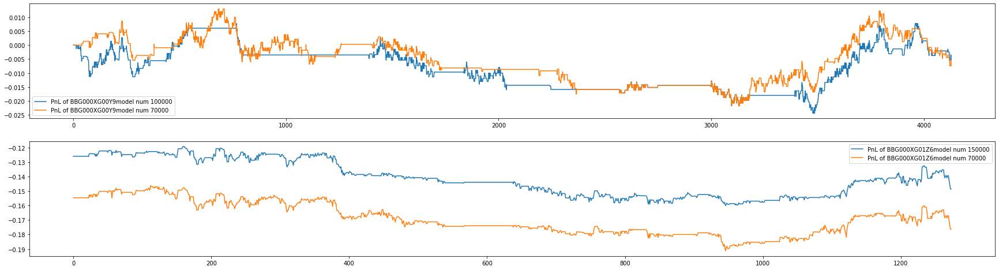

In [161]:
print()

plt.figure(figsize=(30,30))    
plt.subplot(7,1,1)
plt.plot(np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)], label='PnL of ' + DP1.getSym() + 'model num 150000')
plt.plot(np.array(m2m_11[int(len(m2m_11)*0.7):]) - m2m_11[int(len(m2m_11)*0.7)], label='PnL of ' + DP1.getSym() + 'model num 70000' )
plt.legend()
plt.subplot(7,1,2)
plt.plot(m2m_2[int(len(m2m_2)*0.7):], label='PnL of ' + DP2.getSym() + 'model num 150000')
plt.plot(m2m_21[int(len(m2m_21)*0.7):], label='PnL of ' + DP2.getSym() + 'model num 70000')
plt.legend()

In [156]:
(np.array(m2m_11[int(len(m2m_1)*0.7):]) - m2m_11[int(len(m2m_1)*0.7)])[-1]

-0.0023175030946731567

75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.04859517887234688
 pln_full2 = -0.11674749851226807
 pln_test1 = 0.0019532106816768646 
 pln_test2 = -0.12360958056524396
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.06622358411550522
 pln_full2 = -0.04947829991579056
 pln_test1 = 0.007881738245487213 
 pln_test2 = -0.04433031799271703
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = 0.009729623794555664
 pln_full2 = -0.0823700875043869
 pln_test1 = 0.0006262138485908508 
 pln_test2 = -0.08605488832108676
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.015201370231807232
 pln_full2 = -0.12904106080532074
 pln_test1 = 0.014394537545740604 
 pln_test2 = -0.13989585172384977
75600  ticks
75600  ticks
75600  ticks
75600  ticks

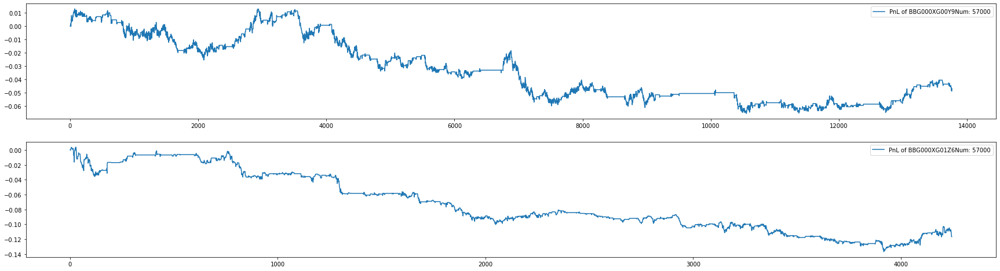

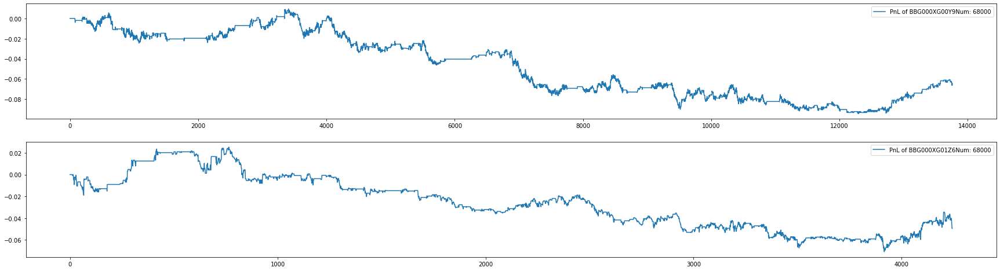

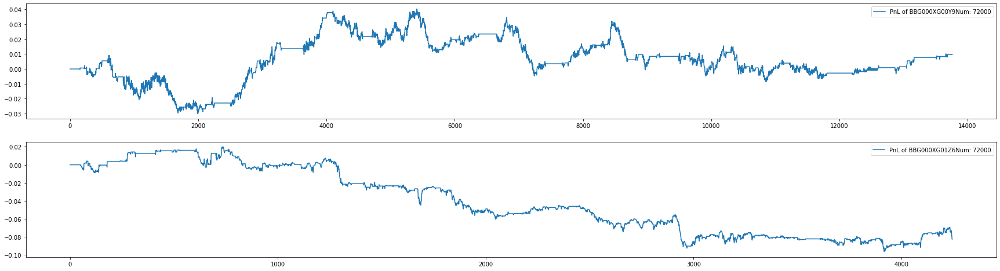

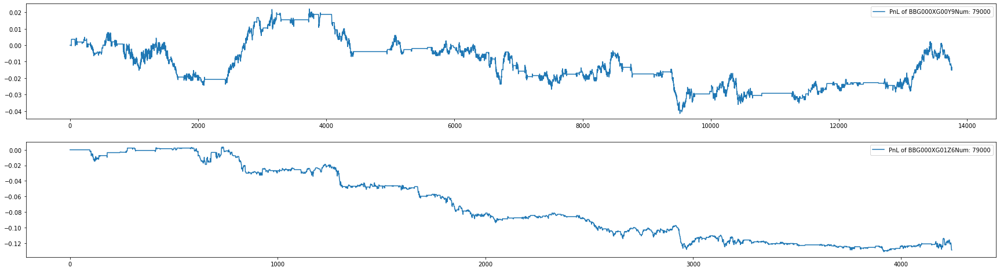

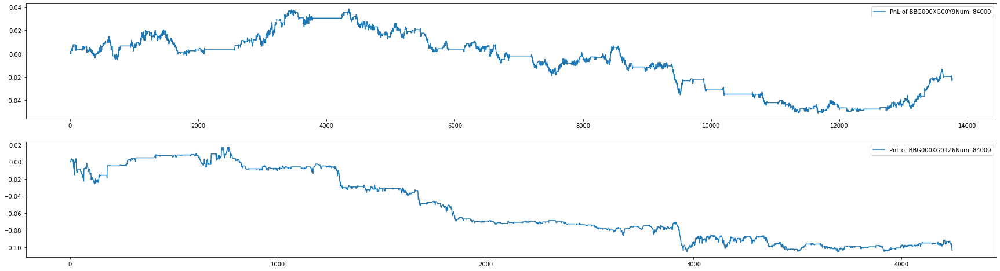

...

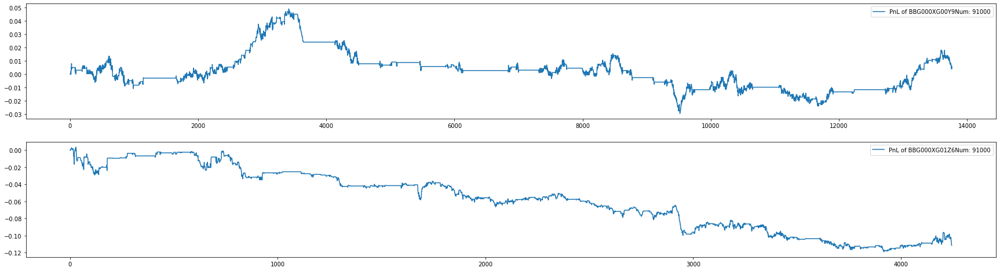

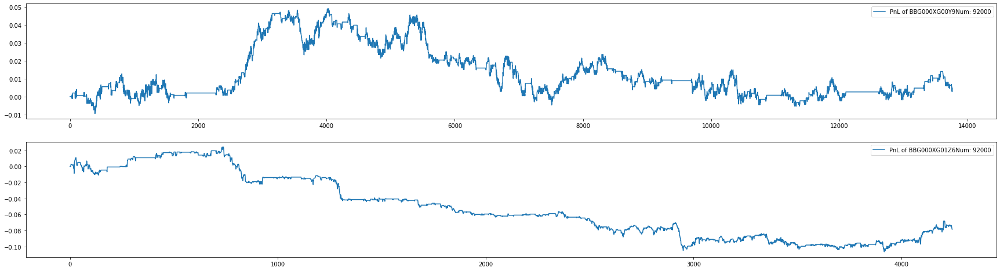

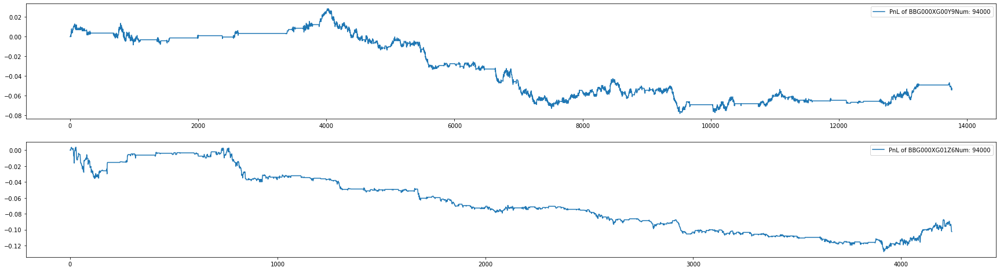

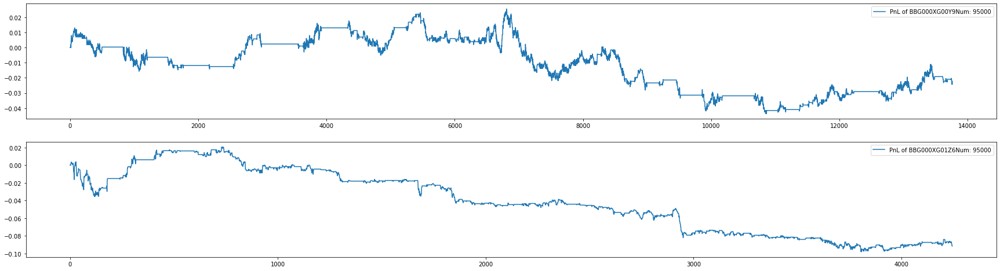

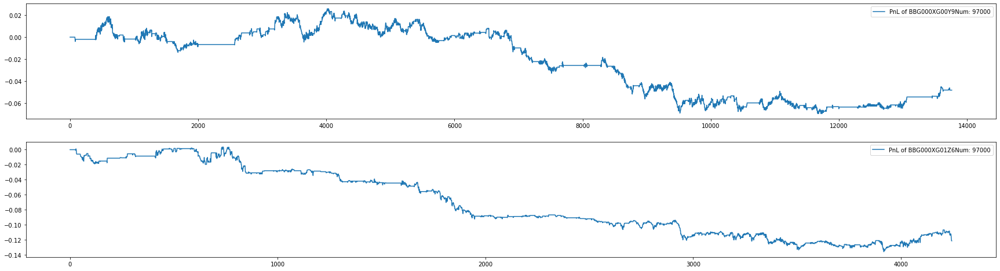

In [117]:
total_pnl_asset1 = []
total_pnl_asset2 = []
test_pnl_asset2 = []
test_pnl_asset1 = []

for i in range(49000, 100000,1000):
    model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
    NN = NNStrategy(mprms)
    NN.setMLAlgorithm(model)
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])
    
    a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
    b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
    total_pnl_asset1.append(m2m_1[-1])
    total_pnl_asset2.append(m2m_2[-1])
    test_pnl_asset2.append(a[-1])
    test_pnl_asset1.append(b[-1])
    if m2m_1[-1]>0 or m2m_2[-1] > 0 or a[-1]>0 or b[-1]>0:
        plt.figure(figsize=(30,30))    
        plt.subplot(7,1,1)
        plt.plot(m2m_1, label='PnL of ' + DP1.getSym() + 'Num: ' +str(i))
        plt.legend()
        plt.subplot(7,1,2)
        plt.plot(m2m_2, label='PnL of ' + DP2.getSym() +'Num: '  + str(i))
        plt.legend()
        
        print('pln_full1 = {}\n pln_full2 = {}\n pln_test1 = {} \n pln_test2 = {}'.format(m2m_1[-1],m2m_2[-1],b[-1],a[-1]))
        
    
    
    
    
    
    
    
    

In [118]:
x = np.arange(49000, 100000,1000)

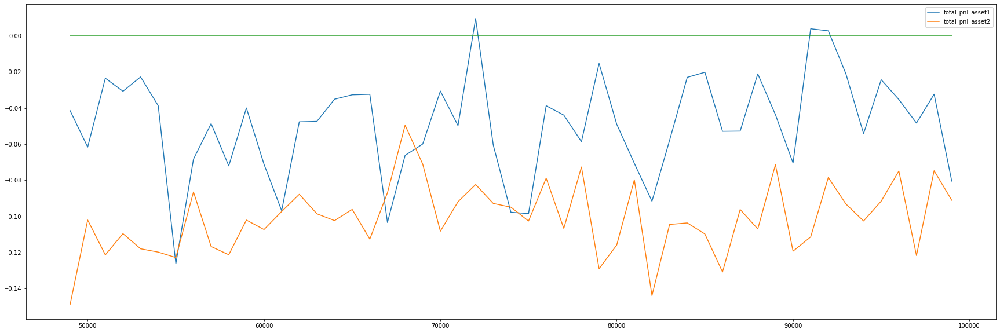

In [127]:
plt.figure(figsize=(30,10))
plt.plot(x,total_pnl_asset1,label = 'total_pnl_asset1')
plt.plot(x,total_pnl_asset2,label = 'total_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

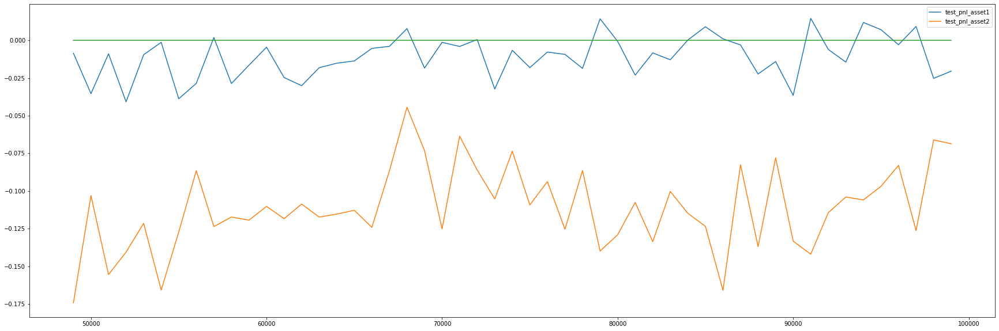

In [128]:
plt.figure(figsize=(30,10))
plt.plot(x,test_pnl_asset1,label = 'test_pnl_asset1')
plt.plot(x,test_pnl_asset2,label = 'test_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

description1:

    total_max_position = 4#2       # max position for all instruments
    max_position = 1.0#0.18          # max position for each instrument #!! Try: 1.0
    order_qty = 1.0#0.18             # qty for one order #!!                Try: 1.0
    dbg_coef = 5                 # debug k, don't use
    exp_sec = 1                  # expiration time in seconds
    limitation = 1               # max count of operation in 1 second
    max_unprofit_count = 3       # num of unprofitable trades (hit-lift protection) 
    cooldown = 1                 # cooldown time in seconds (hit-lift protection)
    place_latency =  10_000_000 #50_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond  #!!
    cancel_latency = 10_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond #!!
    take_cost = 0#7.5              # bips ## !!!
    make_cost = 2.5              # bips ## !!!
    max_pending_orders = 2      # max count of pending orders
    min_price_step = 0.001       # min step in orderbook, $

In [129]:
Inf1 = [total_pnl_asset1,total_pnl_asset2,test_pnl_asset1,test_pnl_asset2]

75600  ticks
pln_full1 = 0.42348042130470276
 pln_full2 = 0.07180191576480865
 pln_test1 = 0.14986738562583923 
 pln_test2 = 0.012804936617612839
75600  ticks
pln_full1 = 0.3407348096370697
 pln_full2 = 0.05606163665652275
 pln_test1 = 0.10841526091098785 
 pln_test2 = -0.020137231796979904
75600  ticks
pln_full1 = 0.372734397649765
 pln_full2 = 0.1210838332772255
 pln_test1 = 0.02225765585899353 
 pln_test2 = 0.07648669183254242
75600  ticks
pln_full1 = 0.36816877126693726
 pln_full2 = 0.07034676522016525
 pln_test1 = 0.09423178434371948 
 pln_test2 = 0.017293397337198257
75600  ticks
pln_full1 = 0.0961351990699768
 pln_full2 = -0.03152130916714668
 pln_test1 = 0.10624820832163095 
 pln_test2 = 0.034067537635564804
75600  ticks
pln_full1 = 0.2799808084964752
 pln_full2 = 0.12940733134746552
 pln_test1 = -0.018227219581604004 
 pln_test2 = 0.0022978931665420532
75600  ticks
pln_full1 = 0.366190642118454
 pln_full2 = 0.03250279650092125
 pln_test1 = 0.15532805025577545 
 pln_test2 = -0.

<ipython-input-131-483942ee69a5>:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(30,30))


pln_full1 = 0.3727768361568451
 pln_full2 = 0.09436370432376862
 pln_test1 = 0.234589084982872 
 pln_test2 = 0.09215988148935139
75600  ticks
pln_full1 = 0.31339162588119507
 pln_full2 = 0.10627437382936478
 pln_test1 = 0.11147335171699524 
 pln_test2 = 0.009923219680786133
75600  ticks
pln_full1 = 0.2458725869655609
 pln_full2 = 0.008891070261597633
 pln_test1 = 0.01495392620563507 
 pln_test2 = -0.08146726153790951
75600  ticks
pln_full1 = 0.45662298798561096
 pln_full2 = 0.13797034323215485
 pln_test1 = 0.16720369458198547 
 pln_test2 = 0.12759395595639944
75600  ticks
pln_full1 = 0.40500515699386597
 pln_full2 = 0.08716296404600143
 pln_test1 = 0.1449665129184723 
 pln_test2 = 0.03324086591601372
75600  ticks
pln_full1 = 0.3112463653087616
 pln_full2 = 0.056392934173345566
 pln_test1 = 0.01792129874229431 
 pln_test2 = -0.06192510202527046
75600  ticks
pln_full1 = 0.32761430740356445
 pln_full2 = -0.001769905793480575
 pln_test1 = 0.12850017845630646 
 pln_test2 = -0.03371855418663

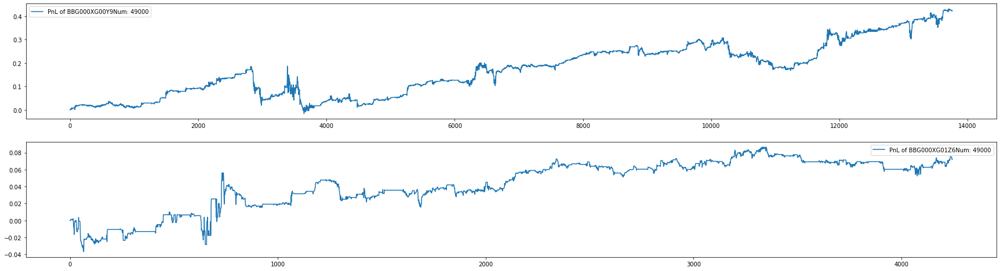

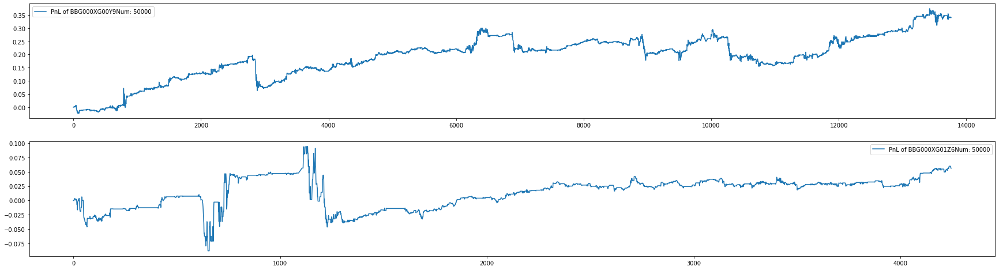

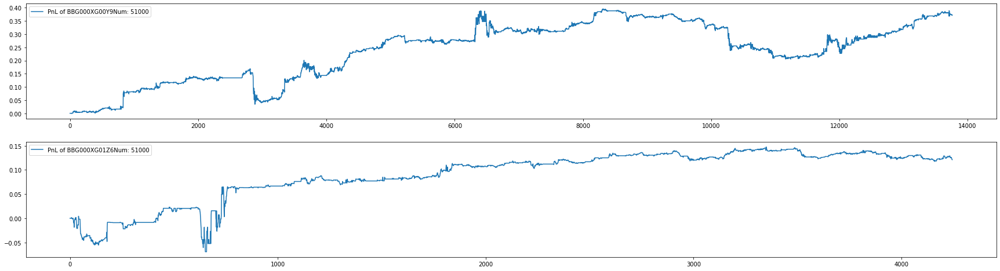

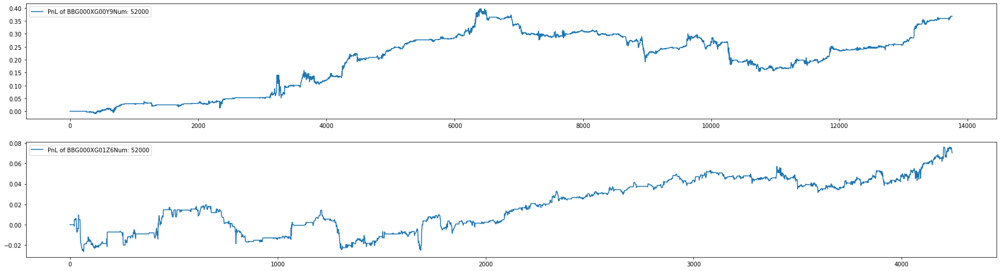

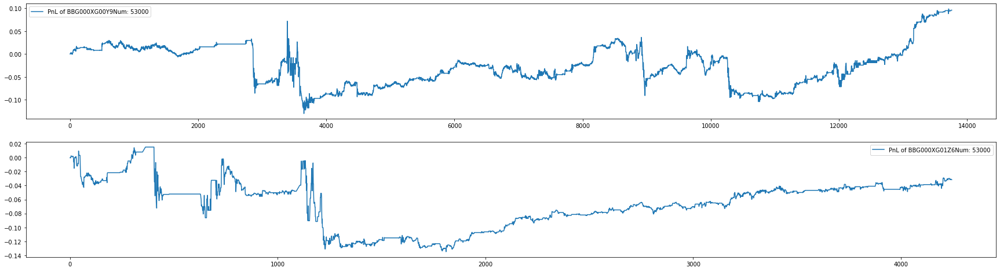

...

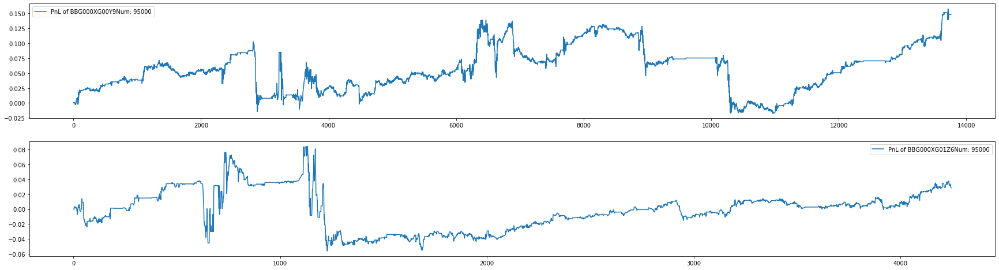

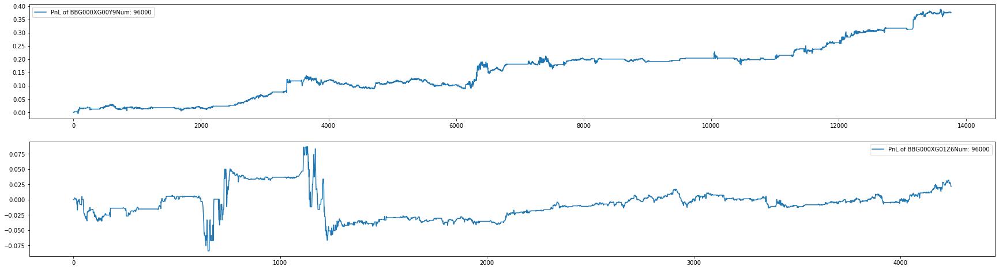

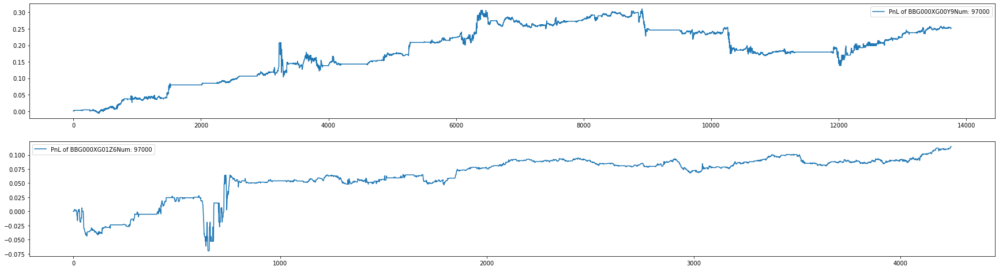

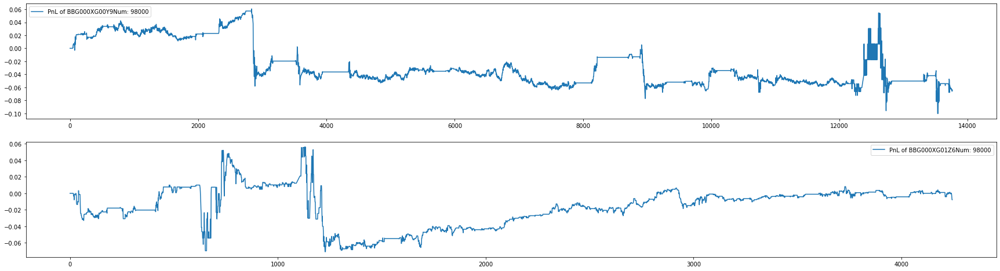

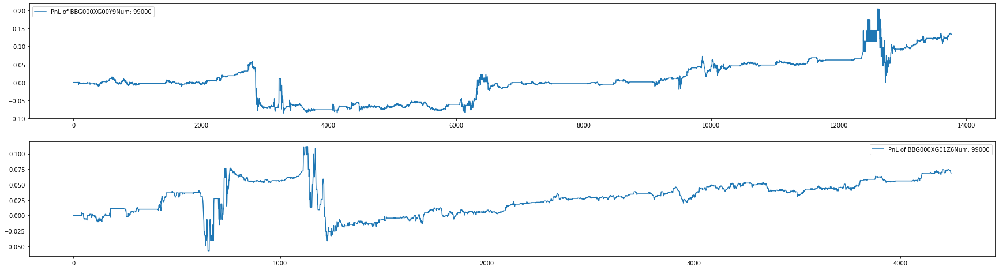

In [131]:
total_pnl_asset1 = []
total_pnl_asset2 = []
test_pnl_asset2 = []
test_pnl_asset1 = []

for i in range(49000, 100000,1000):
    model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
    NN = NNStrategy(mprms)
    NN.setMLAlgorithm(model)
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])
    
    a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
    b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
    total_pnl_asset1.append(m2m_1[-1])
    total_pnl_asset2.append(m2m_2[-1])
    test_pnl_asset2.append(a[-1])
    test_pnl_asset1.append(b[-1])
    if m2m_1[-1]>0 or m2m_2[-1] > 0 or a[-1]>0 or b[-1]>0:
        plt.figure(figsize=(30,30))    
        plt.subplot(7,1,1)
        plt.plot(m2m_1, label='PnL of ' + DP1.getSym() + 'Num: ' +str(i))
        plt.legend()
        plt.subplot(7,1,2)
        plt.plot(m2m_2, label='PnL of ' + DP2.getSym() +'Num: '  + str(i))
        plt.legend()
        
        print('pln_full1 = {}\n pln_full2 = {}\n pln_test1 = {} \n pln_test2 = {}'.format(m2m_1[-1],m2m_2[-1],b[-1],a[-1]))
        
    

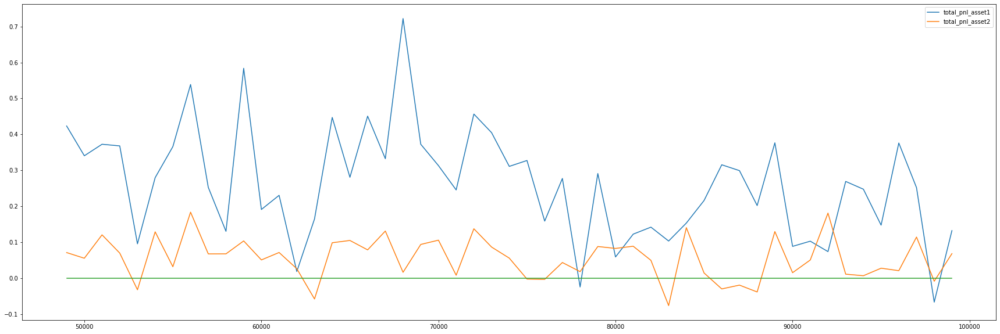

In [132]:
plt.figure(figsize=(30,10))
plt.plot(x,total_pnl_asset1,label = 'total_pnl_asset1')
plt.plot(x,total_pnl_asset2,label = 'total_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

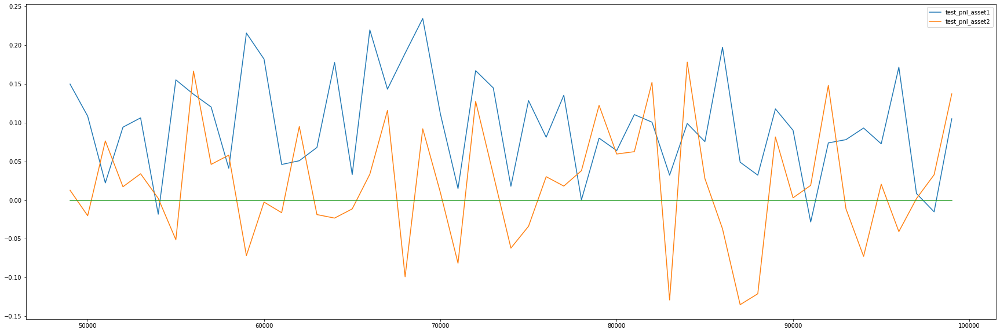

In [133]:
plt.figure(figsize=(30,10))
plt.plot(x,test_pnl_asset1,label = 'test_pnl_asset1')
plt.plot(x,test_pnl_asset2,label = 'test_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

description2:

    total_max_position = 4#2       # max position for all instruments
    max_position = 1.0#0.18          # max position for each instrument #!! Try: 1.0
    order_qty = 1.0#0.18             # qty for one order #!!                Try: 1.0
    dbg_coef = 5                 # debug k, don't use
    exp_sec = 1                  # expiration time in seconds
    limitation = 1               # max count of operation in 1 second
    max_unprofit_count = 3       # num of unprofitable trades (hit-lift protection) 
    cooldown = 1                 # cooldown time in seconds (hit-lift protection)
    place_latency =  0#10_000_000 #50_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond  #!!
    cancel_latency = 10_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond #!!
    take_cost = 0#7.5              # bips ## !!!
    make_cost = 2.5              # bips ## !!!
    max_pending_orders = 3      # max count of pending orders
    min_price_step = 0.001       # min step in orderbook, $
    
    simulation_Queue = True
    simulation_cost = True
    only_agressive_order = False
    only_passive_order = False
    
    
WARNING: In Fact, simulation_Queue = False

In [134]:
Inf2 = [total_pnl_asset1,total_pnl_asset2,test_pnl_asset1,test_pnl_asset2]

75600  ticks
pln_full1 = 0.009428870864212513
 pln_full2 = -0.09696734696626663
 pln_test1 = 0.01254014391452074 
 pln_test2 = -0.1346481889486313
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = 0.006660250015556812
 pln_full2 = -0.13004283607006073
 pln_test1 = -0.004517051391303539 
 pln_test2 = -0.14609072357416153
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.02805856242775917
 pln_full2 = -0.09539685398340225
 pln_test1 = 0.007773447781801224 
 pln_test2 = -0.1103992322459817
75600  ticks
pln_full1 = -0.0016341835726052523
 pln_full2 = -0.10181764513254166
 pln_test1 = 0.006695125950500369 
 pln_test2 = -0.12055011466145515
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = 0.0007073998567648232
 pln_full2 = -0.09461948275566101
 pln_test1 = 0.005121451627928764 
 pln_test2 = -0.12467449344694614
75600  ticks
pln_full1 = -0.05618378892540932
 pln_full2 = -0.09540204703807831
 pln_test1 = 0.0013420917093753815 
 pln_test2 = -0.09023

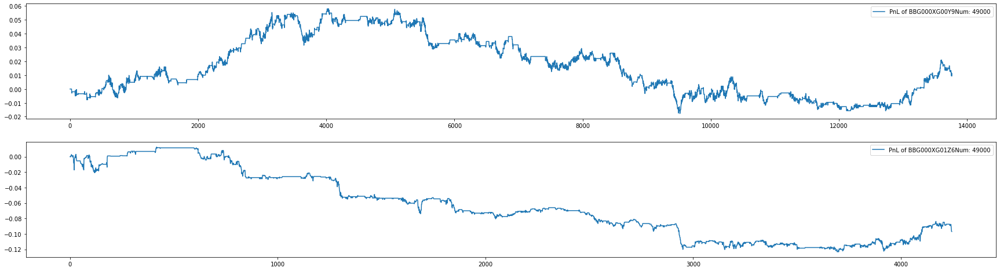

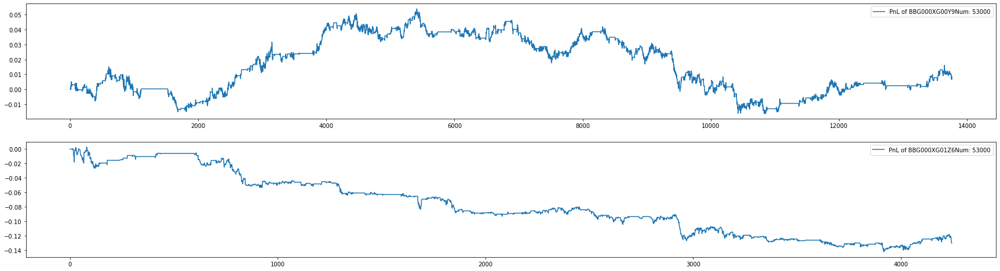

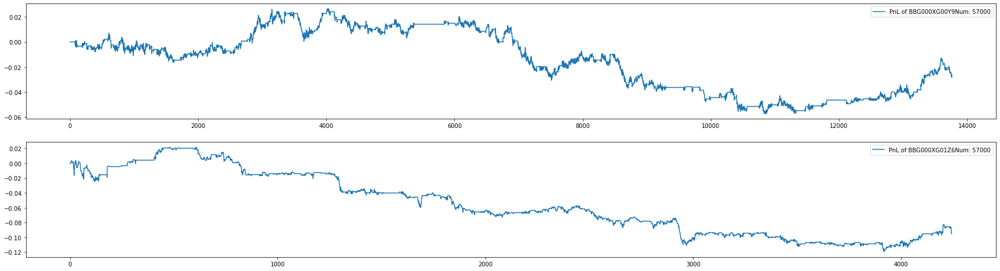

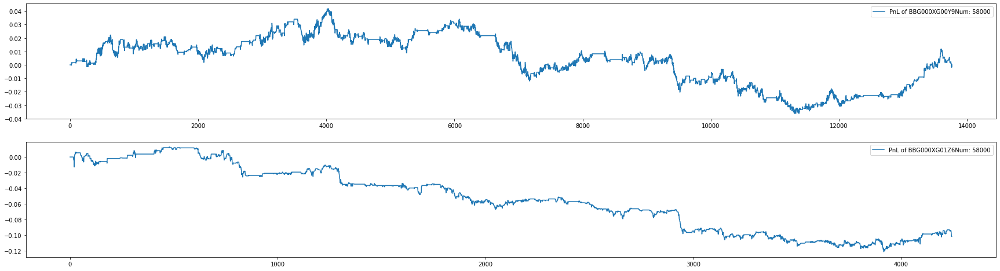

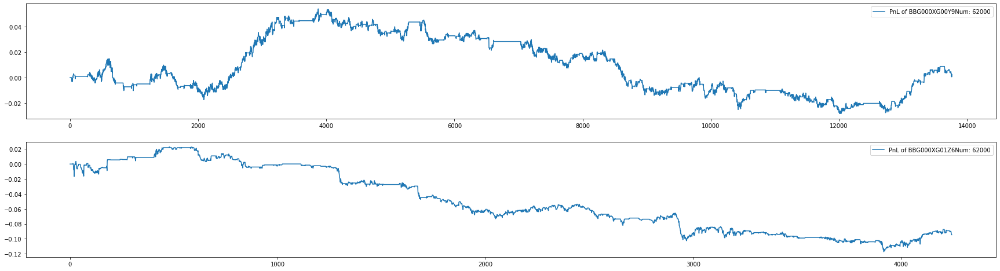

...

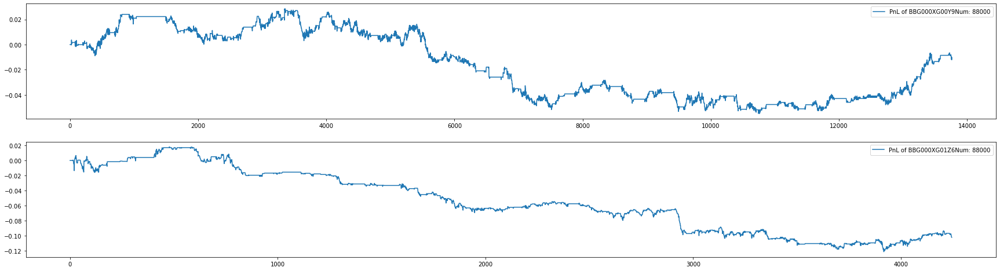

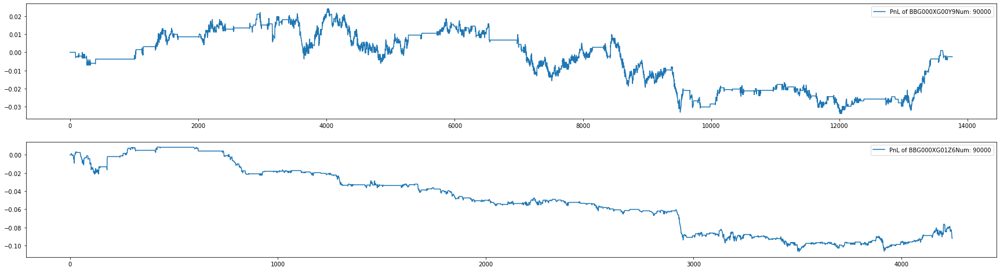

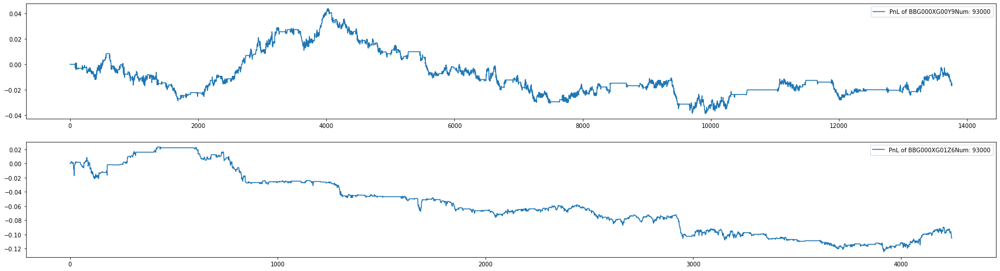

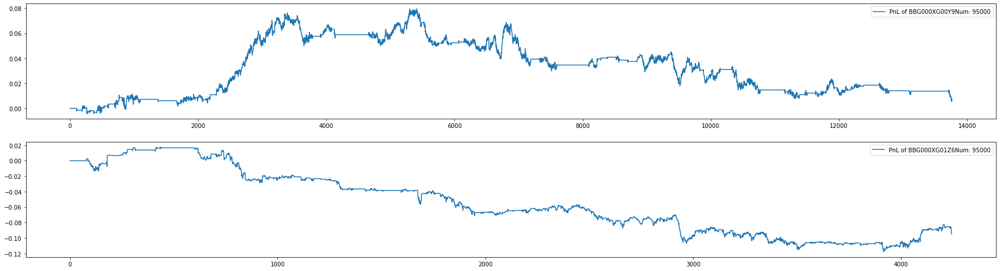

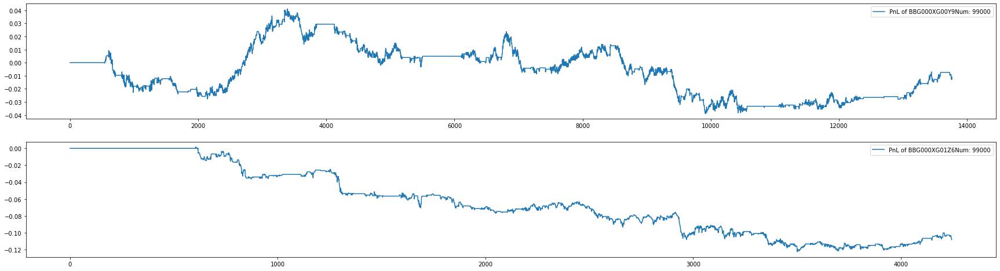

In [136]:
total_pnl_asset1 = []
total_pnl_asset2 = []
test_pnl_asset2 = []
test_pnl_asset1 = []

for i in range(49000, 100000,1000):
    model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
    NN = NNStrategy(mprms)
    NN.setMLAlgorithm(model)
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])
    
    a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
    b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
    total_pnl_asset1.append(m2m_1[-1])
    total_pnl_asset2.append(m2m_2[-1])
    test_pnl_asset2.append(a[-1])
    test_pnl_asset1.append(b[-1])
    if m2m_1[-1]>0 or m2m_2[-1] > 0 or a[-1]>0 or b[-1]>0:
        plt.figure(figsize=(30,30))    
        plt.subplot(7,1,1)
        plt.plot(m2m_1, label='PnL of ' + DP1.getSym() + 'Num: ' +str(i))
        plt.legend()
        plt.subplot(7,1,2)
        plt.plot(m2m_2, label='PnL of ' + DP2.getSym() +'Num: '  + str(i))
        plt.legend()
        
        print('pln_full1 = {}\n pln_full2 = {}\n pln_test1 = {} \n pln_test2 = {}'.format(m2m_1[-1],m2m_2[-1],b[-1],a[-1]))
        

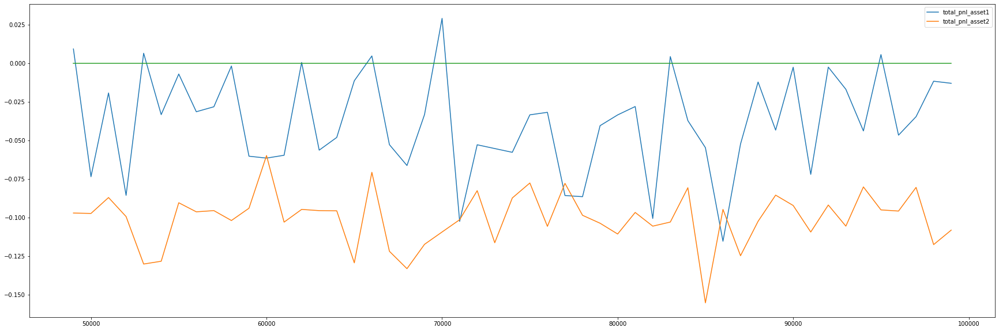

In [137]:
plt.figure(figsize=(30,10))
plt.plot(x,total_pnl_asset1,label = 'total_pnl_asset1')
plt.plot(x,total_pnl_asset2,label = 'total_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

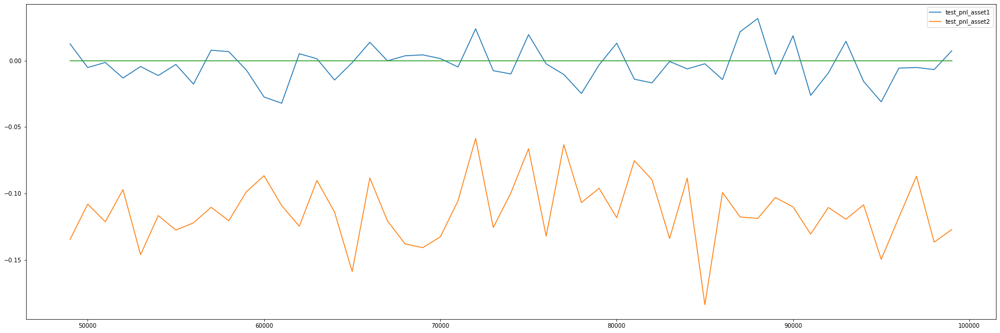

In [138]:
plt.figure(figsize=(30,10))
plt.plot(x,test_pnl_asset1,label = 'test_pnl_asset1')
plt.plot(x,test_pnl_asset2,label = 'test_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

Description3:
    
    total_max_position = 4#2       # max position for all instruments
    max_position = 1.0#0.18          # max position for each instrument #!! Try: 1.0
    order_qty = 1.0#0.18             # qty for one order #!!                Try: 1.0
    dbg_coef = 5                 # debug k, don't use
    exp_sec = 1                  # expiration time in seconds
    limitation = 1               # max count of operation in 1 second
    max_unprofit_count = 3       # num of unprofitable trades (hit-lift protection) 
    cooldown = 1                 # cooldown time in seconds (hit-lift protection)
    place_latency =  10_000_000 #50_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond  #!!
    cancel_latency = 5_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond #!!
    take_cost = 0#7.5              # bips ## !!!
    make_cost = 2.5              # bips ## !!!
    max_pending_orders = 3      # max count of pending orders
    min_price_step = 0.001       # min step in orderbook, $
    
    simulation_Queue = True
    simulation_cost = True
    only_agressive_order = False
    only_passive_order = False

In [140]:
Inf3 = [total_pnl_asset1,total_pnl_asset2,test_pnl_asset1,test_pnl_asset2]

75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.004016744904220104
 pln_full2 = -0.09283003956079483
 pln_test1 = 0.00639539398252964 
 pln_test2 = -0.11499840952455997
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.04481779411435127
 pln_full2 = -0.07028363645076752
 pln_test1 = 0.006846565753221512 
 pln_test2 = -0.08082593325525522
75600  ticks
75600  ticks
75600  ticks
pln_full1 = 0.013105970807373524
 pln_full2 = -0.07089720666408539
 pln_test1 = -0.009786113165318966 
 pln_test2 = -0.08768807351589203
75600  ticks
pln_full1 = -0.003140214132145047
 pln_full2 = -0.0853242501616478
 pln_test1 = 0.01849694992415607 
 pln_test2 = -0.11097112856805325
75600  ticks
pln_full1 = -0.025540094822645187
 pln_full2 = -0.04983308166265488
 pln_test1 = 0.017853278666734695 
 pln_test2 = -0.046043825102970004
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.05888815596699715

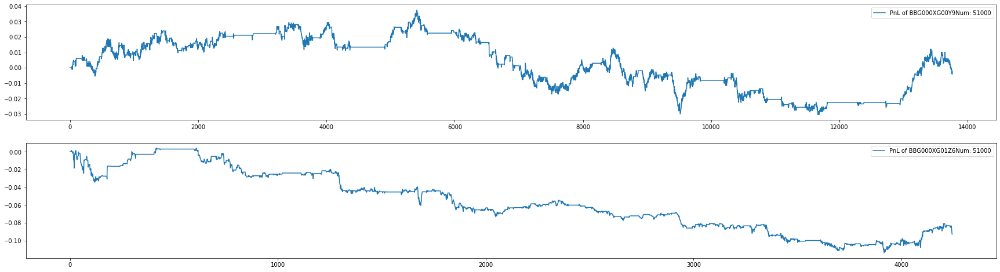

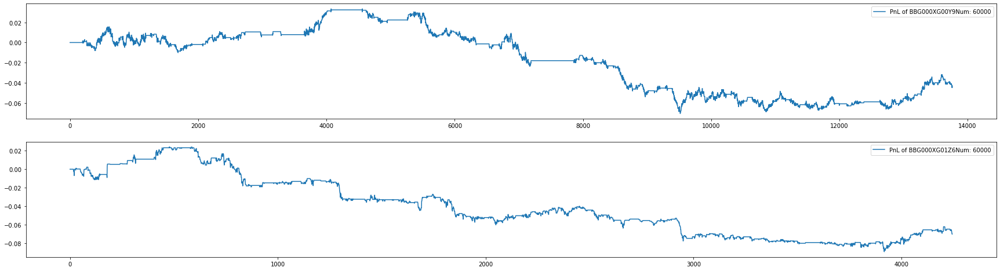

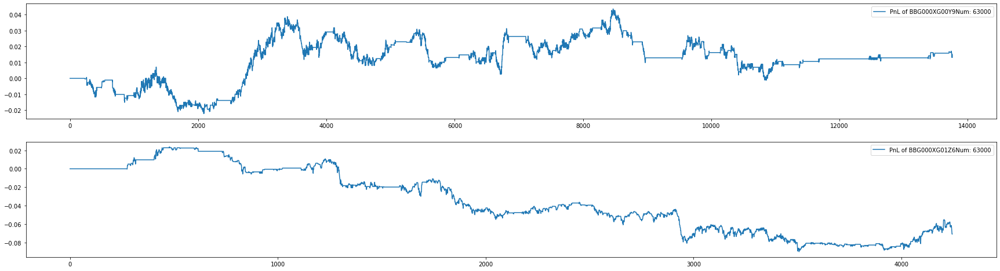

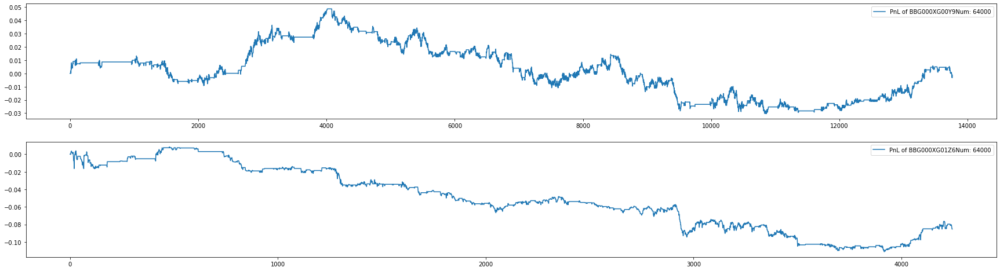

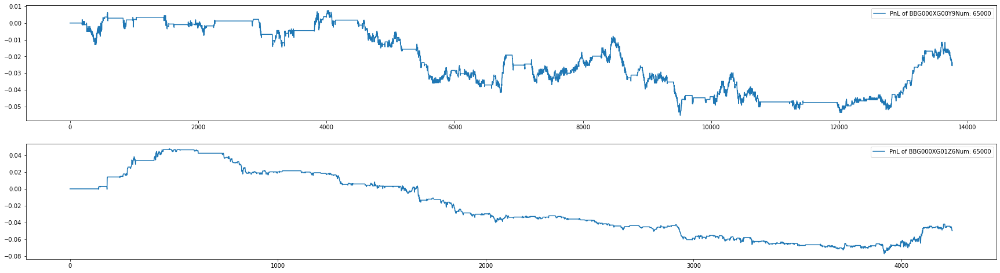

...

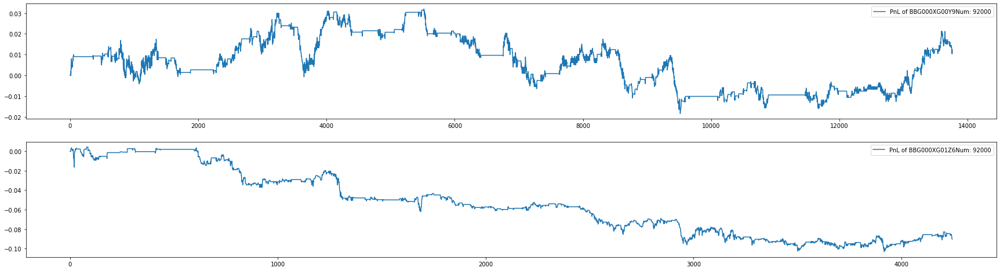

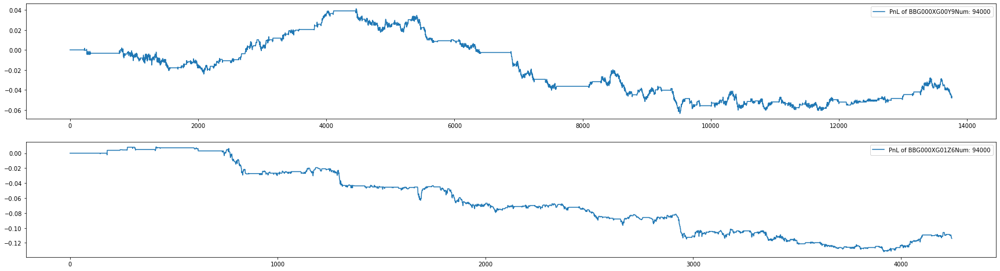

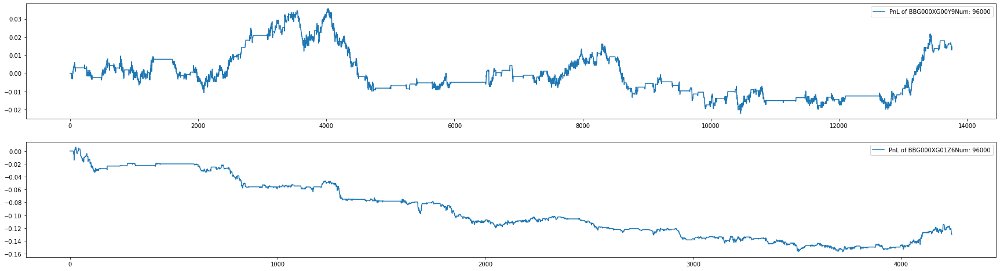

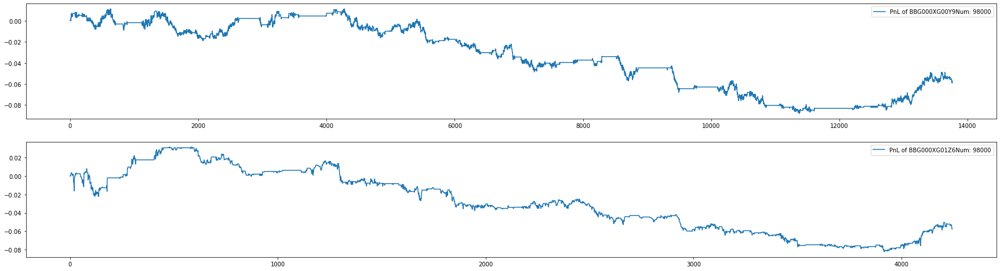

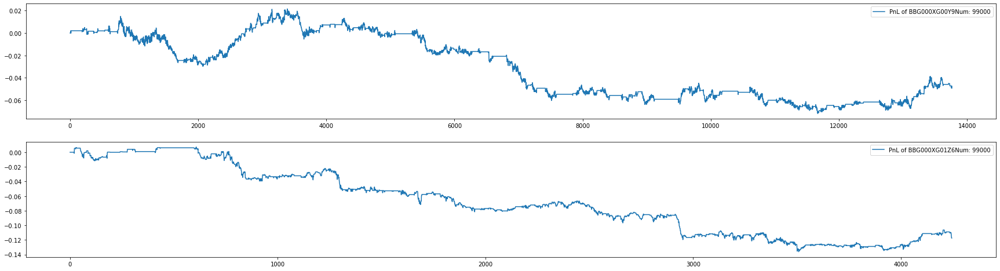

In [146]:
total_pnl_asset1 = []
total_pnl_asset2 = []
test_pnl_asset2 = []
test_pnl_asset1 = []

for i in range(49000, 100000,1000):
    model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
    NN = NNStrategy(mprms)
    NN.setMLAlgorithm(model)
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])
    
    a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
    b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
    total_pnl_asset1.append(m2m_1[-1])
    total_pnl_asset2.append(m2m_2[-1])
    test_pnl_asset2.append(a[-1])
    test_pnl_asset1.append(b[-1])
    if m2m_1[-1]>0 or m2m_2[-1] > 0 or a[-1]>0 or b[-1]>0:
        plt.figure(figsize=(30,30))    
        plt.subplot(7,1,1)
        plt.plot(m2m_1, label='PnL of ' + DP1.getSym() + 'Num: ' +str(i))
        plt.legend()
        plt.subplot(7,1,2)
        plt.plot(m2m_2, label='PnL of ' + DP2.getSym() +'Num: '  + str(i))
        plt.legend()
        
        print('pln_full1 = {}\n pln_full2 = {}\n pln_test1 = {} \n pln_test2 = {}'.format(m2m_1[-1],m2m_2[-1],b[-1],a[-1]))

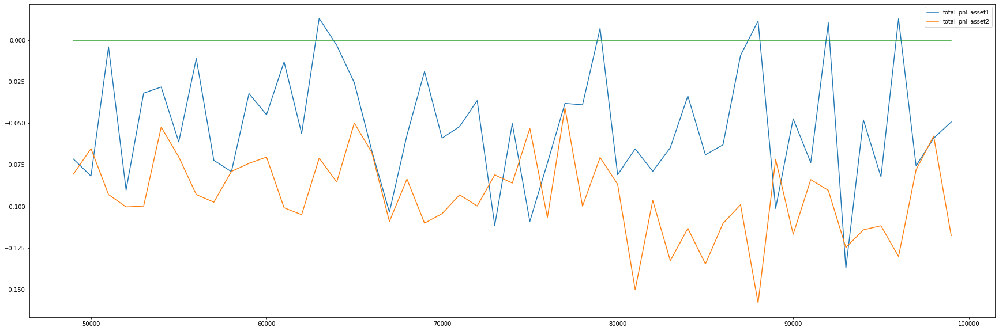

In [148]:


plt.figure(figsize=(30,10))
plt.plot(x,total_pnl_asset1,label = 'total_pnl_asset1')
plt.plot(x,total_pnl_asset2,label = 'total_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

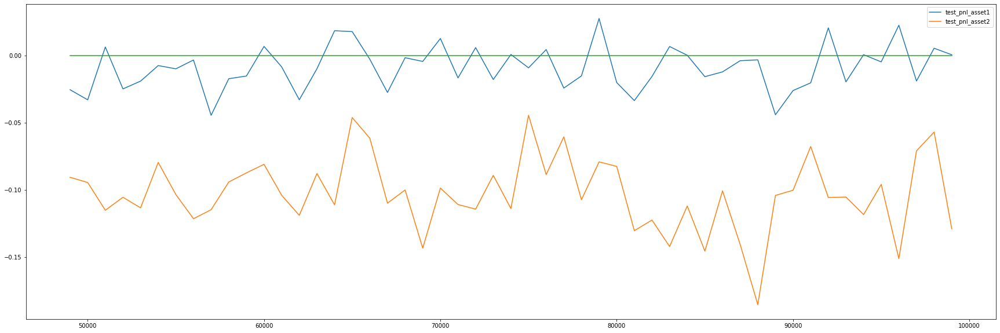

In [149]:
plt.figure(figsize=(30,10))
plt.plot(x,test_pnl_asset1,label = 'test_pnl_asset1')
plt.plot(x,test_pnl_asset2,label = 'test_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

Description4:

    total_max_position = 2       # max position for all instruments
    max_position = 1.0#0.18          # max position for each instrument #!! Try: 1.0
    order_qty = 1.0#0.18             # qty for one order #!!                Try: 1.0
    dbg_coef = 5                 # debug k, don't use
    exp_sec = 1                  # expiration time in seconds
    limitation = 1               # max count of operation in 1 second
    max_unprofit_count = 3       # num of unprofitable trades (hit-lift protection) 
    cooldown = 1                 # cooldown time in seconds (hit-lift protection)
    place_latency =  10_000_000 #50_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond  #!!
    cancel_latency = 5_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond #!!
    take_cost = 0#7.5              # bips ## !!!
    make_cost = 2.5              # bips ## !!!
    max_pending_orders = 3      # max count of pending orders
    min_price_step = 0.001       # min step in orderbook, $
    
    simulation_Queue = True
    simulation_cost = True
    only_agressive_order = False
    only_passive_order = False


In [150]:
Inf4 = [total_pnl_asset1,total_pnl_asset2,test_pnl_asset1,test_pnl_asset2]

Добавляем косты:


75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.10871407389640808
 pln_full2 = -0.14716684818267822
 pln_test1 = 0.0015733689069747925 
 pln_test2 = -0.14945398084819317
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.10082659870386124
 pln_full2 = -0.12376759201288223
 pln_test1 = 0.00826757401227951 
 pln_test2 = -0.12314334575785324
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.03137802332639694
 pln_full2 = -0.16217468678951263
 pln_test1 = 0.006670698523521423 
 pln_test2 = -0.1898382231593132
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.04085129499435425
 pln_full2 = -0.14491859078407288
 pln_test1 = 0.016836654394865036 
 pln_test2 = -0.1365965912118554
75600  ticks
75600  ticks
75600  ticks
75600  ticks
756

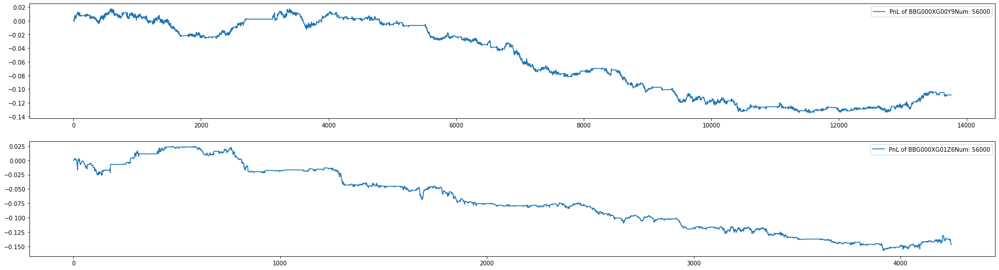

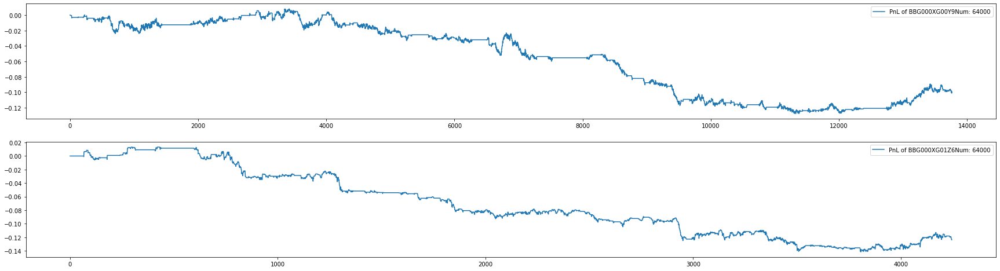

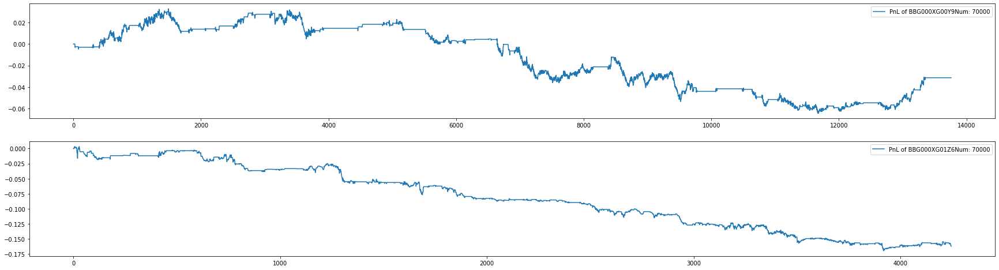

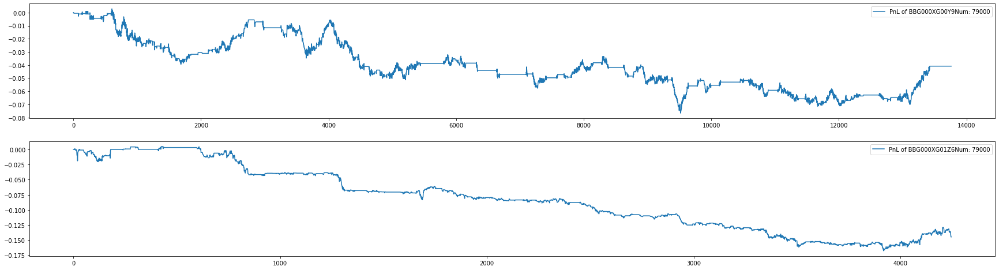

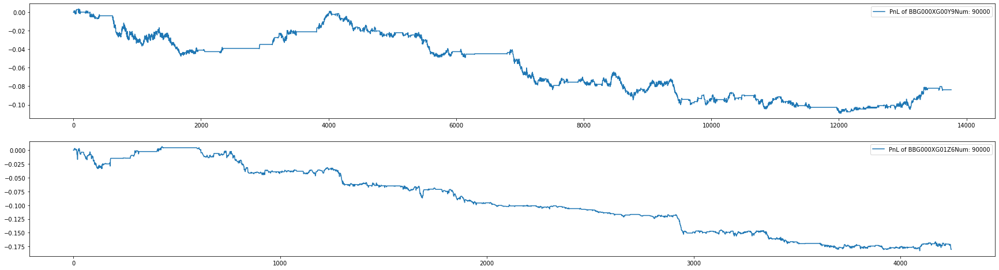

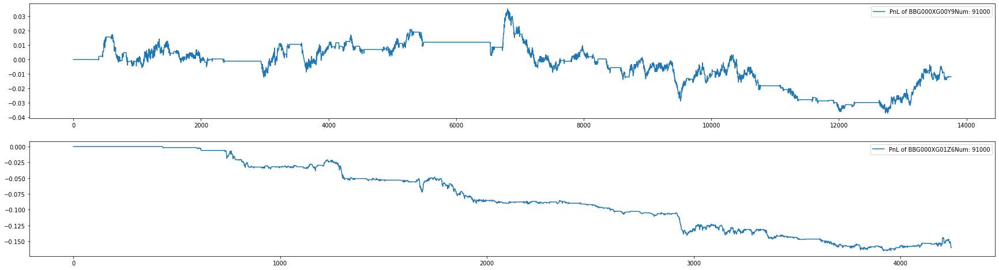

In [152]:
total_pnl_asset1 = []
total_pnl_asset2 = []
test_pnl_asset2 = []
test_pnl_asset1 = []

for i in range(49000, 100000,1000):
    model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
    NN = NNStrategy(mprms)
    NN.setMLAlgorithm(model)
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])
    
    a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
    b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
    total_pnl_asset1.append(m2m_1[-1])
    total_pnl_asset2.append(m2m_2[-1])
    test_pnl_asset2.append(a[-1])
    test_pnl_asset1.append(b[-1])
    if m2m_1[-1]>0 or m2m_2[-1] > 0 or a[-1]>0 or b[-1]>0:
        plt.figure(figsize=(30,30))    
        plt.subplot(7,1,1)
        plt.plot(m2m_1, label='PnL of ' + DP1.getSym() + 'Num: ' +str(i))
        plt.legend()
        plt.subplot(7,1,2)
        plt.plot(m2m_2, label='PnL of ' + DP2.getSym() +'Num: '  + str(i))
        plt.legend()
        
        print('pln_full1 = {}\n pln_full2 = {}\n pln_test1 = {} \n pln_test2 = {}'.format(m2m_1[-1],m2m_2[-1],b[-1],a[-1]))
        

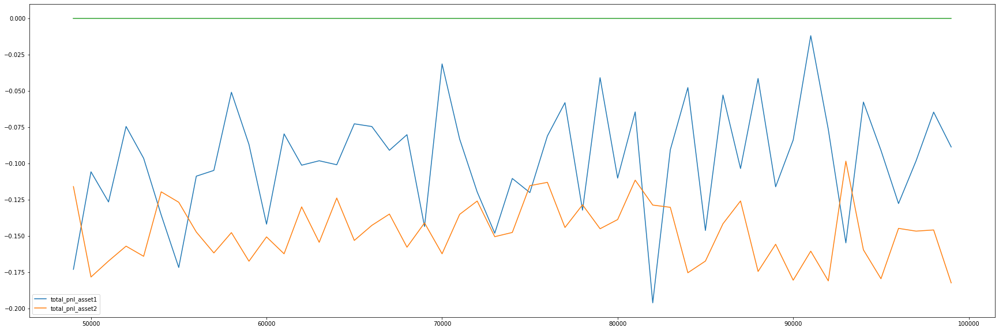

In [153]:

plt.figure(figsize=(30,10))
plt.plot(x,total_pnl_asset1,label = 'total_pnl_asset1')
plt.plot(x,total_pnl_asset2,label = 'total_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

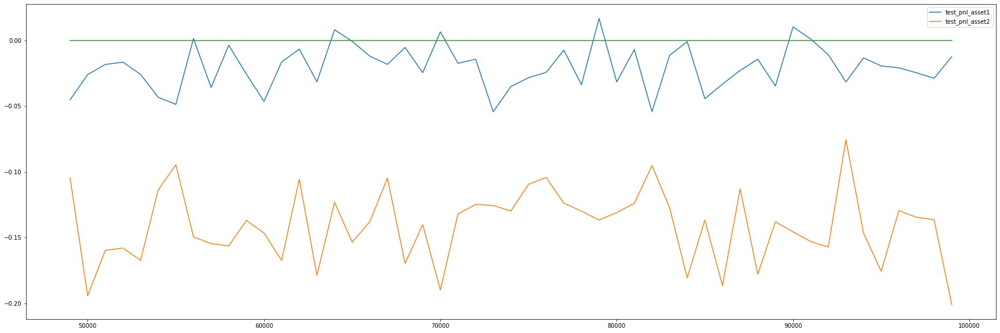

In [154]:
plt.figure(figsize=(30,10))
plt.plot(x,test_pnl_asset1,label = 'test_pnl_asset1')
plt.plot(x,test_pnl_asset2,label = 'test_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

Description5:

    total_max_position = 2       # max position for all instruments
    max_position = 1.0#0.18          # max position for each instrument #!! Try: 1.0
    order_qty = 1.0#0.18             # qty for one order #!!                Try: 1.0
    dbg_coef = 5                 # debug k, don't use
    exp_sec = 1                  # expiration time in seconds
    limitation = 1               # max count of operation in 1 second
    max_unprofit_count = 3       # num of unprofitable trades (hit-lift protection) 
    cooldown = 1                 # cooldown time in seconds (hit-lift protection)
    place_latency =  10_000_000 #50_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond  #!!
    cancel_latency = 5_000_000  # 1_000_000_000 = 1 second; 1_000_000 = 1 milisecond #!!
    take_cost = 1.#7.5              # bips ## !!!
    make_cost = 2.5              # bips ## !!!
    max_pending_orders = 3      # max count of pending orders
    min_price_step = 0.001       # min step in orderbook, $
    
    simulation_Queue = True
    simulation_cost = True
    only_agressive_order = False
    only_passive_order = False

In [162]:
Inf5 = [total_pnl_asset1,total_pnl_asset2,test_pnl_asset1,test_pnl_asset2]

75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.06497486680746078
 pln_full2 = -0.1430378258228302
 pln_test1 = 0.008882395923137665 
 pln_test2 = -0.13756419532001019
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = 0.012794536538422108
 pln_full2 = -0.21133626997470856
 pln_test1 = -0.014494090341031551 
 pln_test2 = -0.22294840589165688
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
pln_full1 = -0.14887207746505737
 pln_full2 = -0.2005086392164230

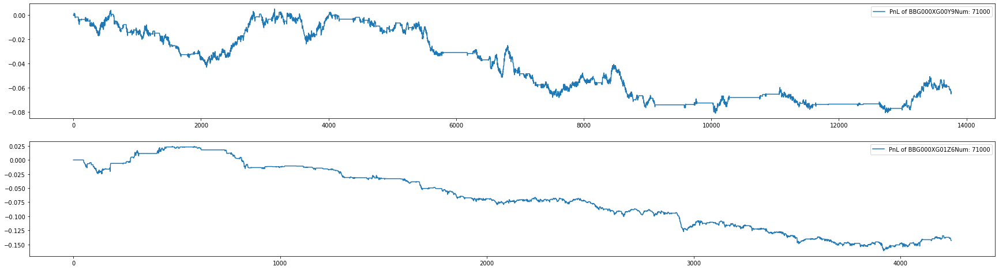

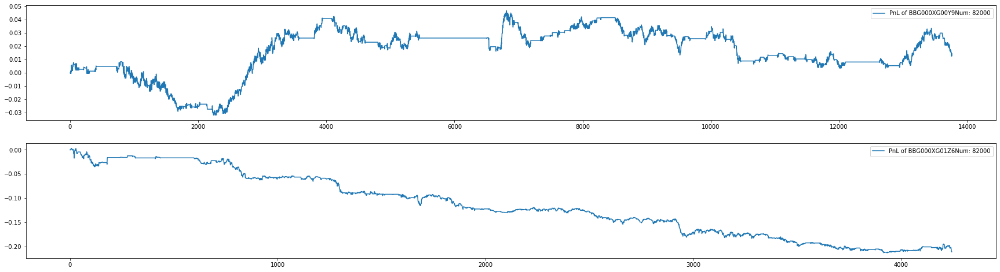

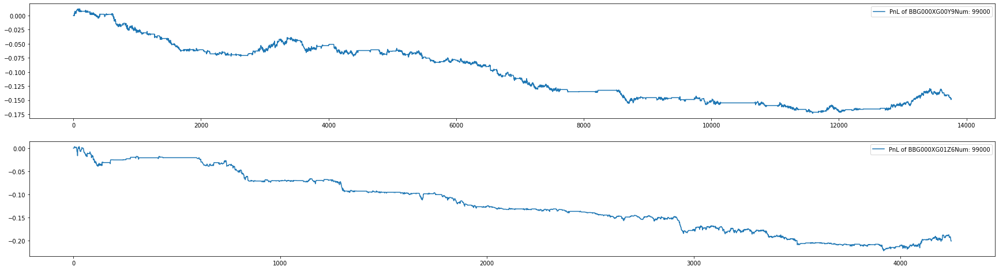

In [164]:
total_pnl_asset1 = []
total_pnl_asset2 = []
test_pnl_asset2 = []
test_pnl_asset1 = []

for i in range(49000, 100000,1000):
    model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
    NN = NNStrategy(mprms)
    NN.setMLAlgorithm(model)
    m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2])
    
    a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
    b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
    total_pnl_asset1.append(m2m_1[-1])
    total_pnl_asset2.append(m2m_2[-1])
    test_pnl_asset2.append(a[-1])
    test_pnl_asset1.append(b[-1])
    if m2m_1[-1]>0 or m2m_2[-1] > 0 or a[-1]>0 or b[-1]>0:
        plt.figure(figsize=(30,30))    
        plt.subplot(7,1,1)
        plt.plot(m2m_1, label='PnL of ' + DP1.getSym() + 'Num: ' +str(i))
        plt.legend()
        plt.subplot(7,1,2)
        plt.plot(m2m_2, label='PnL of ' + DP2.getSym() +'Num: '  + str(i))
        plt.legend()
        
        print('pln_full1 = {}\n pln_full2 = {}\n pln_test1 = {} \n pln_test2 = {}'.format(m2m_1[-1],m2m_2[-1],b[-1],a[-1]))
        

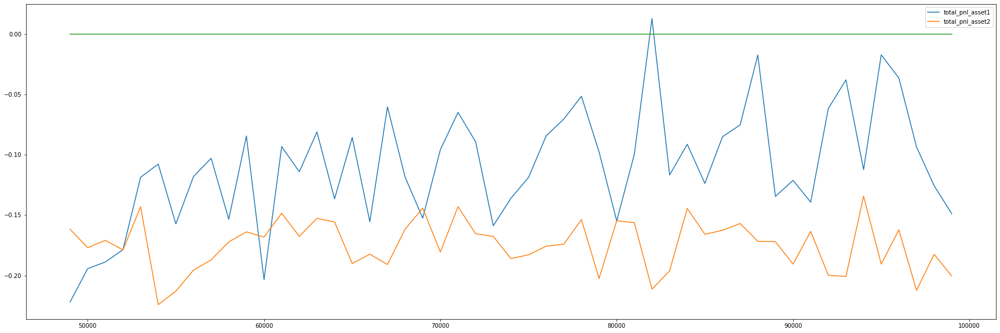

In [165]:
plt.figure(figsize=(30,10))
plt.plot(x,total_pnl_asset1,label = 'total_pnl_asset1')
plt.plot(x,total_pnl_asset2,label = 'total_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

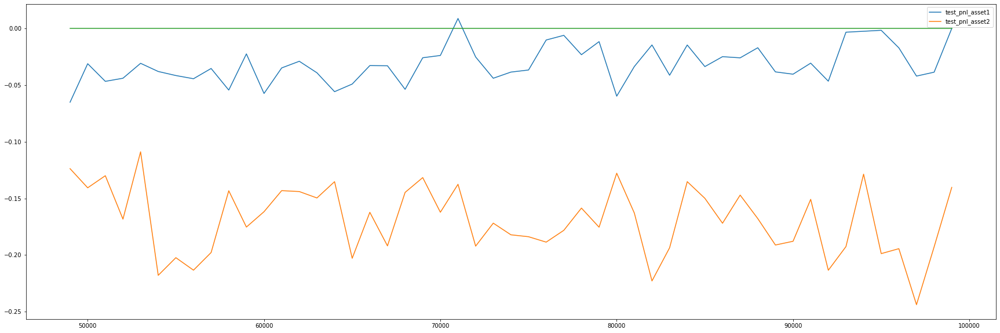

In [166]:
plt.figure(figsize=(30,10))
plt.plot(x,test_pnl_asset1,label = 'test_pnl_asset1')
plt.plot(x,test_pnl_asset2,label = 'test_pnl_asset2')
plt.plot([49000,99000],[0,0])
plt.legend()

Description6:

As in description5, but cost = 1.5

Построим графики лучшего pnl в зависимости от костов

In [172]:
best_pnl_A1_total = []
best_pnl_A2_total = []

best_pnl_A1_test = []
best_pnl_A2_test = []

for c in np.arange(0.,3.,0.3):
    total_pnl_asset1 = []
    total_pnl_asset2 = []
    test_pnl_asset2 = []
    test_pnl_asset1 = []

    for i in range(49000, 100000,1000):
        model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
        NN = NNStrategy(mprms)
        NN.setMLAlgorithm(model)
        m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2],c)
    
        a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
        b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
        total_pnl_asset1.append(m2m_1[-1])
        total_pnl_asset2.append(m2m_2[-1])
        test_pnl_asset2.append(a[-1])
        test_pnl_asset1.append(b[-1])
    best_pnl_A1_total.append(max(total_pnl_asset1))
    best_pnl_A2_total.append(max(total_pnl_asset2))
    
    best_pnl_A1_test.append(max(test_pnl_asset1))
    best_pnl_A2_test.append(max(test_pnl_asset2))


75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks

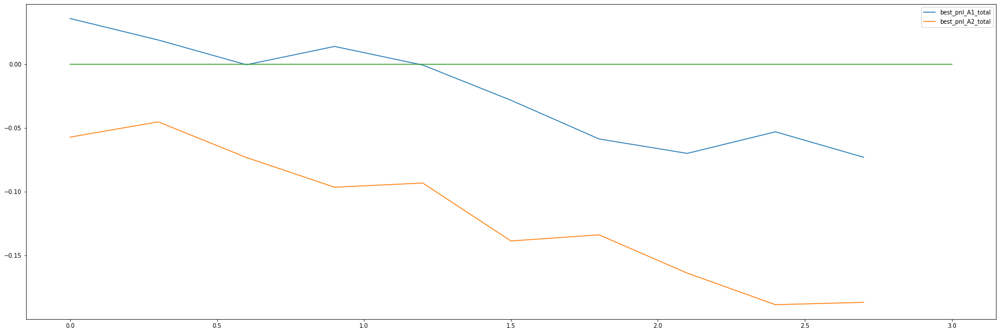

In [173]:
X  = np.arange(0.,3.,0.3)

plt.figure(figsize=(30,10))
plt.plot(X,best_pnl_A1_total,label = 'best_pnl_A1_total')
plt.plot(X,best_pnl_A2_total,label = 'best_pnl_A2_total')
plt.plot([0,3.],[0,0])
plt.legend()

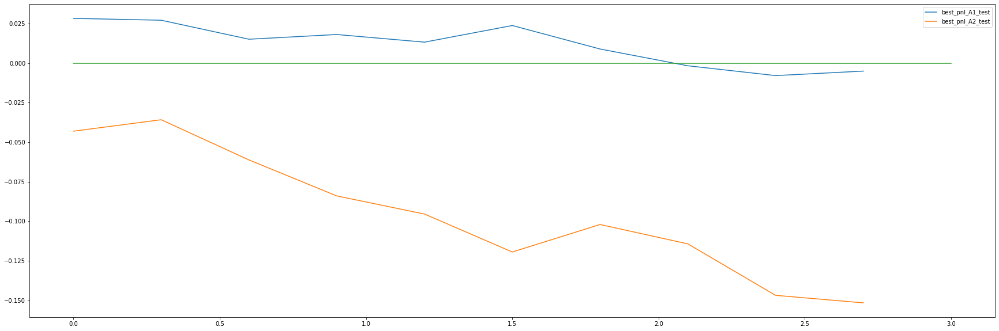

In [174]:
X  = np.arange(0.,3.,0.3)

plt.figure(figsize=(30,10))
plt.plot(X,best_pnl_A1_test,label = 'best_pnl_A1_test')
plt.plot(X,best_pnl_A2_test,label = 'best_pnl_A2_test')
plt.plot([0,3.],[0,0])
plt.legend()

In [177]:
best_pnl_A1_total_lat = []
best_pnl_A2_total_lat = []

best_pnl_A1_test_lat = []
best_pnl_A2_test_lat = []

for pl in [0,3_000_000,5_000_000,7_000_000,10_000_000,15_000_000,20_000_000]:
    total_pnl_asset1 = []
    total_pnl_asset2 = []
    test_pnl_asset2 = []
    test_pnl_asset1 = []

    for i in range(49000, 100000,1000):
        model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
        NN = NNStrategy(mprms)
        NN.setMLAlgorithm(model)
        m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2],pl_l = pl)
    
        a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
        b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
        total_pnl_asset1.append(m2m_1[-1])
        total_pnl_asset2.append(m2m_2[-1])
        test_pnl_asset2.append(a[-1])
        test_pnl_asset1.append(b[-1])
    best_pnl_A1_total_lat.append(max(total_pnl_asset1))
    best_pnl_A2_total_lat.append(max(total_pnl_asset2))
    
    best_pnl_A1_test_lat.append(max(test_pnl_asset1))
    best_pnl_A2_test_lat.append(max(test_pnl_asset2))


75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks

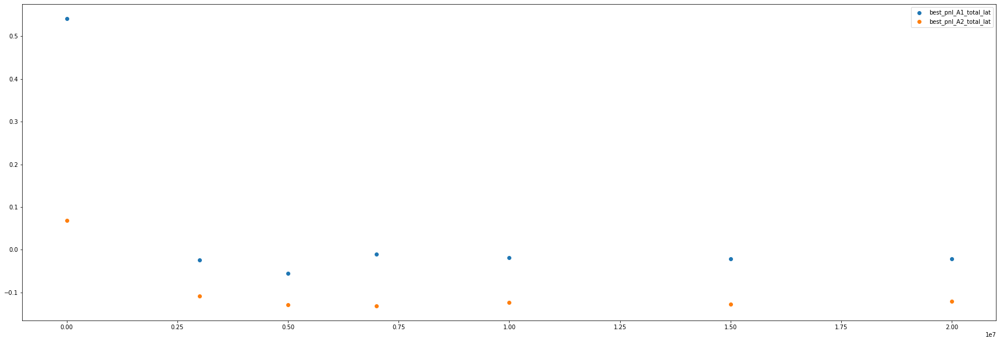

In [181]:
X  = [0,3_000_000,5_000_000,7_000_000,10_000_000,15_000_000,20_000_000]

plt.figure(figsize=(30,10))
plt.scatter(X,best_pnl_A1_total_lat,label = 'best_pnl_A1_total_lat')
plt.scatter(X,best_pnl_A2_total_lat,label = 'best_pnl_A2_total_lat')
#plt.plot([0,3.],[0,0])
plt.legend()

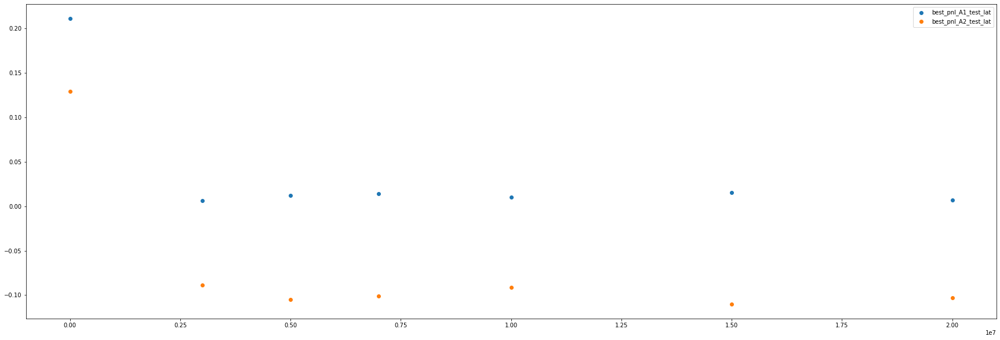

In [180]:
plt.figure(figsize=(30,10))
plt.scatter(X,best_pnl_A1_test_lat,label = 'best_pnl_A1_test_lat')
plt.scatter(X,best_pnl_A2_test_lat,label = 'best_pnl_A2_test_lat')
#plt.plot([0,3.],[0,0])
plt.legend()

## Heat Map

In [ ]:
best_pnl_A1_total = []
best_pnl_A2_total = []

best_pnl_A1_test = []
best_pnl_A2_test = []

for c in np.arange(0.,3.,0.27):
    best_pnl_A1_total_lat = []
    best_pnl_A2_total_lat = []

    best_pnl_A1_test_lat = []
    best_pnl_A2_test_lat = []
    for pl in [0,3_000_000,7_000_000,10_000_000]:
        total_pnl_asset1 = []
        total_pnl_asset2 = []
        test_pnl_asset2 = []
        test_pnl_asset1 = []

        for i in range(49000, 100000,1000):
            model = torch.load('cc_net/exp-2_pm_ang/model_'+ str(i) +'.chk')
            NN = NNStrategy(mprms)
            NN.setMLAlgorithm(model)
            m2m_1,m2m_2,pos_1,pos_2,comm_1,comm_2 = Backtest(NN,DP,[DP1,DP2],c,pl_l = pl)
    
            a = np.array(m2m_2[int(len(m2m_2)*0.7):]) - m2m_1[int(len(m2m_2)*0.7)]
            b = np.array(m2m_1[int(len(m2m_1)*0.7):]) - m2m_1[int(len(m2m_1)*0.7)]
    
            total_pnl_asset1.append(m2m_1[-1])
            total_pnl_asset2.append(m2m_2[-1])
            test_pnl_asset2.append(a[-1])
            test_pnl_asset1.append(b[-1])
        best_pnl_A1_total_lat.append(max(total_pnl_asset1))
        best_pnl_A2_total_lat.append(max(total_pnl_asset2))
    
        best_pnl_A1_test_lat.append(max(test_pnl_asset1))
        best_pnl_A2_test_lat.append(max(test_pnl_asset2))
        
        print('Pl_cycle_end')
        
    best_pnl_A1_total.append(best_pnl_A1_total_lat)
    best_pnl_A2_total.append(best_pnl_A2_total_lat)
    
    best_pnl_A1_test.append(best_pnl_A1_test_lat)
    best_pnl_A2_test.append(best_pnl_A2_test_lat)

75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
Pl_cycle_end
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks
75600  ticks

In [183]:
import seaborn as sns

In [186]:
best_pnl_A1_total

[0.5022240877151489,
 0.5060766339302063,
 0.4540296494960785,
 0.5218177437782288,
 0.4378582835197449,
 0.5104566812515259,
 0.3805936276912689,
 0.4255666434764862,
 0.4333524703979492,
 0.49096736311912537]

In [185]:
c=[]
for i in np.arange(0.,3.,0.3):
    for j in [0,3_000_000,5_000_000,7_000_000,10_000_000]:
        c.append(i)

DICT = {'Max Pnl A1 total' : [best_pnl_A1_total[i][j] for i in range(len(best_pnl_A1_total)) for j in range(5)],
 'Max Pnl A2 total' : [best_pnl_A2_total[i][j] for i in range(len(best_pnl_A2_total)) for j in range(5)],
 'Cost' : c,
  'Pl_l' : [0,3_000_000,5_000_000,7_000_000,10_000_000]*np.arange(0.,3.,0.3).shape[0],
 'Max Pnl A1 test' : [best_pnl_A1_test[i][j] for i in range(len(best_pnl_A1_test)) for j in range(5)],
'Max Pnl A2 test' : [best_pnl_A2_test[i][j] for i in range(len(best_pnl_A2_test)) for j in range(5)]}

 
 





TypeError: 'float' object is not subscriptable